<a href="https://colab.research.google.com/github/CallmeQuant/Studying-Notebook/blob/main/Forecast/Nixtla/Demand_forecasting_with_Nixtla_using_MLForecast.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Demand forecasting with Nixtla: An Example**

# **Environment Setups**

It is recommended to use Colab or you can activate a Python environment and manually install the following requirements. Here I list several important libraries for modelling (especially [**nitxlaverse**](https://www.nixtla.io/) libraries)
```
pip install -U "gluonts[torch]==0.11.0" "optuna~=2.10.0"
pip install lightgbm xgboost
pip install datasetsforecast
pip install mlforecast
pip install statsforecast
pip install neuralforecast
```

In [2]:
from google.colab import drive
drive.mount("/content/drive")
from google.colab import files

Mounted at /content/drive


In [3]:
%%capture
# !pip install darts
# !pip install -U "gluonts[torch]==0.11.0" "optuna~=2.10.0"
!pip install ipykernel
!pip install --upgrade nbformat
!pip install lightgbm xgboost catboost
!pip install distributed
!pip install datasetsforecast
!pip install darts
!pip install mlforecast
!pip install statsforecast
!pip install neuralforecast

In [4]:
# !pip install --upgrade torch>=0.12.0

## **Importing Libraries**

In [5]:
%matplotlib inline

import pandas as pd
import numpy as np
import seaborn as sns
import itertools
from tqdm.notebook import tqdm_notebook
from time import time

# For ACF plot
import darts
from darts import TimeSeries
from darts.utils.statistics import plot_acf, check_seasonality, extract_trend_and_seasonality
from darts.utils.utils import ModelMode

# Statsforecast
from statsforecast import StatsForecast as sf


# Neuralforecast
from neuralforecast import NeuralForecast


# Mlforecast
from mlforecast import MLForecast

from sklearn.preprocessing import MinMaxScaler, OneHotEncoder

import torch

import matplotlib.pyplot as plt
# Plotting params

plot_params = {
    "font.size": 15,
    "figure.facecolor": "white",
    "axes.facecolor": "white",
    "axes.grid": True,
    "grid.linestyle": "-",
    "grid.linewidth": 0.5,
    "axes.spines.top": False,
    "axes.spines.right": False,
    "axes.labelsize": 15,
    "legend.fontsize": 8,
    "xtick.labelsize": 8,
    "ytick.labelsize": 8,
    "axes.titlesize": 18,
    "figure.dpi": 150,
    "figure.constrained_layout.use": True,
    "figure.autolayout": False}

plt.style.use("ggplot")
plt.rcParams.update(plot_params)
# plt.rcParams["font.size"] = 15
# # plt.rcParams['axes.facecolor'] = 'white'
# # Set the background color to white
# plt.rcParams['figure.facecolor'] = 'white'
# plt.rcParams['axes.facecolor'] = 'white'

# # Only show major gridlines
# plt.rcParams['axes.grid'] = True
# plt.rcParams['grid.linestyle'] = '-'
# plt.rcParams['grid.linewidth'] = 0.5

# # Only show left and bottom axes
# plt.rcParams['axes.spines.top'] = False
# plt.rcParams['axes.spines.right'] = False
COLORS = list(sns.color_palette())

/usr/local/lib/python3.10/dist-packages/statsforecast/core.py:25: TqdmExperimentalWarning: Using `tqdm.autonotebook.tqdm` in notebook mode. Use `tqdm.tqdm` instead to force console mode (e.g. in jupyter console)
  from tqdm.autonotebook import tqdm


# **Dataset Information**

In this tutorial, we will train and evaluate multiple time-series forecasting models using the [Store Item Demand Forecasting Challenge dataset from Kaggle](https://www.kaggle.com/competitions/demand-forecasting-kernels-only/data?select=train.csv). This dataset has 10 different stores and each store has 50 items, i.e. total of 500 daily level time series data for five years (2013–2017).

## **Download data**

* Download the train.csv from https://www.kaggle.com/competitions/demand-forecasting-kernels-only/data?select=train.csv.
* If you use colab, create a folder in Drive, add this data and retrieve the directory. Otherwise, create a `./data` directory inside the directory of this Python notebook and save the dataset inside this directory.

# **Data Processing**


## **Printing Function**

In [6]:
# Printing information function
def print_info(info, *args):
  print(
      '-'*len(info),
      info,
      '-'*len(info),
      *args,
      sep = '\n'
  )

## **Data Loading**

In [7]:
%%time
train = pd.read_csv("drive/MyDrive/data/train_nitxla.csv", parse_dates = ["date"], index_col = 0)
test = pd.read_csv("drive/MyDrive/data/test_nitxla.csv", parse_dates = ["date"], index_col = 0)
train = train.reset_index()
train.head()

CPU times: user 642 ms, sys: 72.8 ms, total: 715 ms
Wall time: 1.53 s


,date,store,item,sales
0,2013-01-01,1,1,13
1,2013-01-02,1,1,11
2,2013-01-03,1,1,14
3,2013-01-04,1,1,13
4,2013-01-05,1,1,10


## **Sales Data Examining**

We present all attributes our dataset. For the sake of simplicity, there are no holiday effects or store closures.

* date - Date of the sale data.
* store - Store ID
* item - Item ID
* sales - Number of items sold at a specific store on a specific date.

### **Basic Information**

In [8]:
num_item = train.item.nunique()
num_store = train.store.nunique()
num_ts = train.groupby(["store", "item"]).ngroups
train_start = train.date.min().date()
train_end = train.date.max().date()
num_train_date = train.date.nunique()
train_len = (train_end - train_start).days + 1

In [9]:
print_info(
    "Basic information of data",
    f"Number of item types      : {num_item}",
    f"Number of stores            : {num_store}",
    f"Number of store-item pairs: {num_item * num_store}",
    f"Number of time series     : {num_ts}",
    "",
    f"Number of unique train dates: {num_train_date}",
    f"Train date range            : {train_len} days from {train_start} to {train_end}")

-------------------------
Basic information of data
-------------------------
Number of item types      : 50
Number of stores            : 10
Number of store-item pairs: 500
Number of time series     : 500

Number of unique train dates: 1826
Train date range            : 1826 days from 2013-01-01 to 2017-12-31


### **Reformatting Data Types for Store and Item Columns**

The store and item columns indicate each available opend store and product types. Hence, it is reasonable to assert that these information must be in `string` type.

In [10]:
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 913000 entries, 0 to 912999
Data columns (total 4 columns):
 #   Column  Non-Null Count   Dtype         
---  ------  --------------   -----         
 0   date    913000 non-null  datetime64[ns]
 1   store   913000 non-null  int64         
 2   item    913000 non-null  int64         
 3   sales   913000 non-null  int64         
dtypes: datetime64[ns](1), int64(3)
memory usage: 27.9 MB


In [11]:
train[["store", "item"]] = train[["store", "item"]].astype(str)
test[["store", "item"]] = train[["store", "item"]].astype(str)

### **Creating Additional Dataset for Further Use**

I will create two more dataframes for further use if necessary, which are  sales based on daily basis and monthly basis respectively. However, I will first combine `store` and `item` columns together to create a new id column.

In [12]:
train["store_item"] = train["store"] + "_" + train["item"]
test["store_item"] = test["store"] + "_" + test["item"]

In [13]:
item_sales_per_date = train.groupby(["date","store_item"])["sales"].aggregate("sum")
item_sales_per_date = item_sales_per_date.reset_index()
item_sales_per_date.columns = ["date","store_item","sales"]
item_sales_per_date = item_sales_per_date.sort_values("date", ascending=True)
item_sales_per_date.head()

,date,store_item,sales
0,2013-01-01,10_1,14
341,2013-01-01,6_47,5
340,2013-01-01,6_46,23
339,2013-01-01,6_45,34
338,2013-01-01,6_44,17


In [14]:
item_sales_per_month = train.copy()
col = ['year_month', 'store_item','sales']
item_sales_per_month = item_sales_per_month.assign(
    year_month = lambda x: x.date.dt.to_period('M')
)
item_sales_per_month = item_sales_per_month.drop(columns =
                                                 list(
                                                    set(
                                                        item_sales_per_month.columns).difference(
                                                            set(col))))
item_sales_per_month= item_sales_per_month[col]
item_sales_per_month = item_sales_per_month.groupby(["year_month","store_item"])["sales"].aggregate("sum")
item_sales_per_month = item_sales_per_month.reset_index()
item_sales_per_month.columns = ["year_month","store_item","sales"]
item_sales_per_month = item_sales_per_month.sort_values("year_month", ascending=True)
item_sales_per_month.head()

,year_month,store_item,sales
0,2013-01,10_1,447
341,2013-01,6_47,314
340,2013-01,6_46,805
339,2013-01,6_45,1054
338,2013-01,6_44,384


### **Checking Missing Dates and Imputing Missing Values**

Our target is to forecast the sales for the grocery retailer. With 10 stores and 50 types of products sold, this amounts to 1826 sales series for forecasting. Fortunately, we can see that there are **no missing gaps** (missing dates) in our target series.

In [15]:
missing_dates = pd.date_range(train_start, train_end).difference(train.date.unique())
missing_dates = missing_dates.strftime('%Y-%m-%d').tolist()
unique_dp_count = train.groupby(["store", "item"]).date.count().unique().tolist()

In [16]:
print_info('Missing dates in time series data',
           f"Missing dates: {missing_dates}")

---------------------------------
Missing dates in time series data
---------------------------------
Missing dates: []


### **Additional: Missing Values Scenario**

Fortunately, our sales data does not contain any missing values. However,  I will provide a simple, yet efficient strategy to fill the missing values if that situation occurs. We create a multiindex consisting of unique ids of our data (in our case they are the triplet `date`-`store`-`item` which we can further reduce  by merging `store`-`item` into one unique id). Then we will reindex our original sales data with the new multi-index and fill the appropriate NaN values for each data types.

In [17]:
multiindex = list(zip(item_sales_per_date["date"], item_sales_per_date["store_item"]))
multiindex = pd.MultiIndex.from_tuples(multiindex, names=('index_1', 'index_2'))

dataset = item_sales_per_date.copy()
dataset.index = multiindex

idx_dates = list(pd.date_range(min(item_sales_per_date["date"]), max(item_sales_per_date["date"])))
idx_ids = list(dataset["store_item"].unique())
idx = list(itertools.product(idx_dates, idx_ids))
dataset = dataset.reindex(index = idx, columns = None)
dataset = dataset.reset_index()
dataset.head()

dataset["date"] = dataset["date"].fillna(dataset["index_1"])
dataset["store_item"] = dataset["store_item"].fillna(dataset["index_2"])
dataset["sales"] = dataset["sales"].fillna(0)
dataset = dataset.drop(columns=["index_1", "index_2"])
# dataset = dataset.set_index("date")
# dataset.index.name = "date"
dataset.head()


# Second approach (do not merge store-item into one)

# multi_idx = pd.MultiIndex.from_product(
#     [pd.date_range(train_start, train_end), train['store'].unique(),
#      train['item'].unique()],
#     names = ['date','store','item']
# )
# train = train.set_index(['date','store','item']).reindex(
#     multi_idx).reset_index()
# train[['sales']] = train[['sales']].fillna(0.)
# train['id'] = train['id'].interpolate(method = 'linear')

,date,store_item,sales
0,2013-01-01,10_1,14
1,2013-01-01,6_47,5
2,2013-01-01,6_46,23
3,2013-01-01,6_45,34
4,2013-01-01,6_44,17


In [18]:
dataset.to_csv('clean_train_nixtla.csv')

### **Checking for duplicate rows**

In [19]:
count_duplicate_rows = len(train)-len(train.drop_duplicates())
print_info(f"Number of duplicate rows: {count_duplicate_rows}")

---------------------------
Number of duplicate rows: 0
---------------------------


### **Sales Data EDA**

Before diving into modeling, it is crucial to first analyze our data and discover any underlying patterns using either visualizations or hypothesis testing if necessary. Before examining, we will reshape our data from long form to wide form. There are no specific reasons for this action since either forms can be less difficult to work with in different situations. Our data after being reshaped will have the index being the time dimension represented by `date` and the columns are the `sales` for each store-item pair.

In [20]:
sales_ts = pd.pivot_table(train, values="sales", index="date", columns=["store", "item"])

In [21]:
sales_ts.head()

store        1                                      ...   9                  \
item         1  10  11  12  13  14  15  16  17  18  ...  46  47  48  49   5   
date                                                ...                       
2013-01-01  13  37  37  33  37  22  42  14  13  38  ...  34   6  28  11   9   
2013-01-02  11  34  43  35  31  35  33  11  18  51  ...  28  14  38  16  11   
2013-01-03  14  32  34  41  50  26  45  12  15  42  ...  41  18  24  20   8   
2013-01-04  13  45  52  45  45  32  39  15  19  50  ...  41  15  30  19  15   
2013-01-05  10  35  45  46  49  31  47  22  16  56  ...  42  13  33  16  13   

store                           
item        50   6   7   8   9  
date                            
2013-01-01  36  29  30  45  27  
2013-01-02  44  33  24  43  36  
2013-01-03  29  19  35  34  25  
2013-01-04  43  33  35  41  31  
2013-01-05  53  36  28  49  30  

[5 rows x 500 columns]

For visualization purposes, there is a need to scale our data if we want to look at the average value of the `sales` column. This helps to balance the impact across all store-item pairs on the average value.

In [22]:
# scale target series
scaler = MinMaxScaler()
sales_ts_scaled = sales_ts.copy()
sales_ts_scaled[sales_ts_scaled.columns] = scaler.fit_transform(sales_ts_scaled)

**Summary: Target series are nearly positive with only one target seres equal to zero**

It appears that our sales from all store does not suffer from the issue of intermittency (or being sporadic), which sales exhibit many gaps with zero sales. Moreover, since all sales are positive, we are confident that the type of product being sold can be **fast-moving consumer goods**, which must be consumed in the short term.

---------------------
Dates with zero sales
---------------------
Corresponding counts of zero sales: [1]
Date with zero sales: 0    2014-01-15
Name: date, dtype: object
Corresponding counts of high zero sales     : []
Total number of target series          : 500


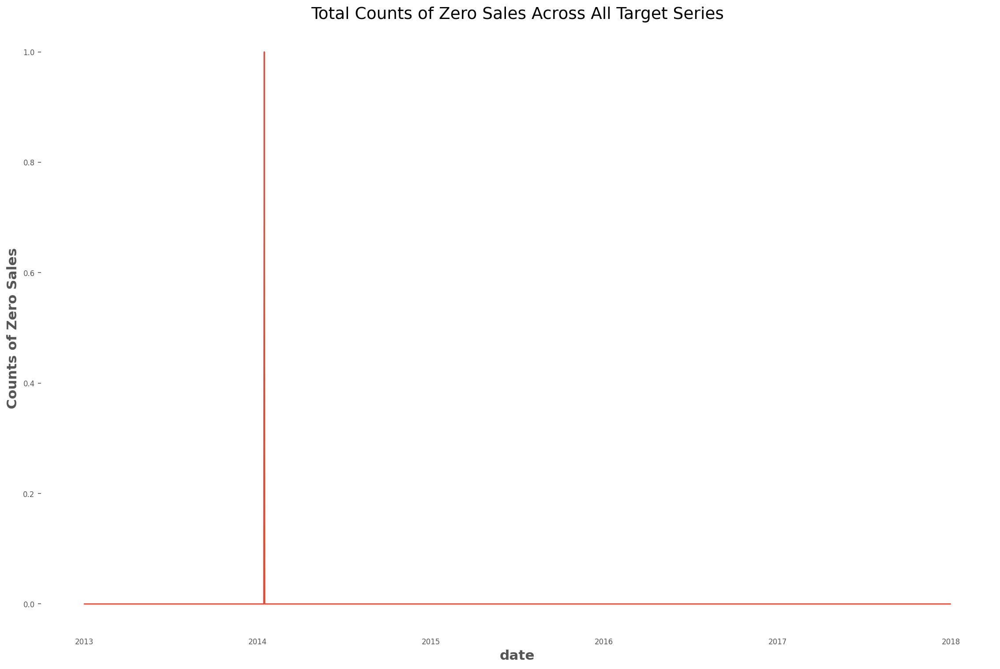

In [23]:
def plot_zero_sales(high_zero_threshold = 1000):
  zero_valued_ts = (sales_ts.eq(0)).sum(axis = 1).to_frame("zero_sales_ct").reset_index()
  zero_valued = zero_valued_ts[(zero_valued_ts.zero_sales_ct.gt(0)) & (zero_valued_ts.zero_sales_ct.lt(high_zero_threshold
                              ))].reset_index(drop = True)
  zero_dates =  zero_valued.date.dt.strftime("%Y-%m-%d")
  zero_counts = zero_valued[zero_valued.date.isin(zero_dates)].zero_sales_ct.tolist()

  zero_valued_extreme = zero_valued_ts[zero_valued_ts.zero_sales_ct.gt(high_zero_threshold)].reset_index(drop = True)
  high_zero_dates = zero_valued_extreme.date.dt.strftime("%Y-%m-%d")
  high_zero_counts = zero_valued_extreme[zero_valued_extreme.date.isin(high_zero_dates)].zero_sales_ct.tolist()
  print_info(
        "Dates with zero sales",
        f"Corresponding counts of zero sales: {zero_counts}",
        f"Date with zero sales: {zero_dates}",
        f"Corresponding counts of high zero sales     : {high_zero_counts}",
        f"Total number of target series          : {num_ts}",
    )

  plt.figure(figsize = (15, 10))

  sns.lineplot(data=zero_valued_ts, x="date", y="zero_sales_ct")
  sns.scatterplot(
      data=zero_valued_extreme, x="date", y="zero_sales_ct",
      color=COLORS[1],
      edgecolor=COLORS[1],
      zorder=2,
  )
  for j in range(len(zero_valued_extreme.index)):
      ha = "left" if j%2==0 else "right"
      offset = pd.Timedelta(7, "d") if ha=="left" else pd.Timedelta(-7, "d")
      plt.text(
          x=zero_valued_extreme.date[j]+offset, y=zero_valued_extreme.zero_sales_ct[j],
          s=zero_valued_extreme.date[j].strftime("%Y-%m-%d"),
          ha=ha,
          va="center",
          size=14,
      )
  plt.ylabel("Counts of Zero Sales")
  plt.title("Total Counts of Zero Sales Across All Target Series")
  plt.tight_layout()
  plt.grid(True)
  plt.show()

plot_zero_sales()

**Summary: The distribution of sales among stores are less volatile than that among product types**

We investigate the two relationships: store locations vs sales and item types vs sales. Regarding the former, most boxplots resemble to each other with the average sales varying from 75,000 to 125,000. However, the sales among each item fluctuate sharply, which indicate the variability in nature of each product.  

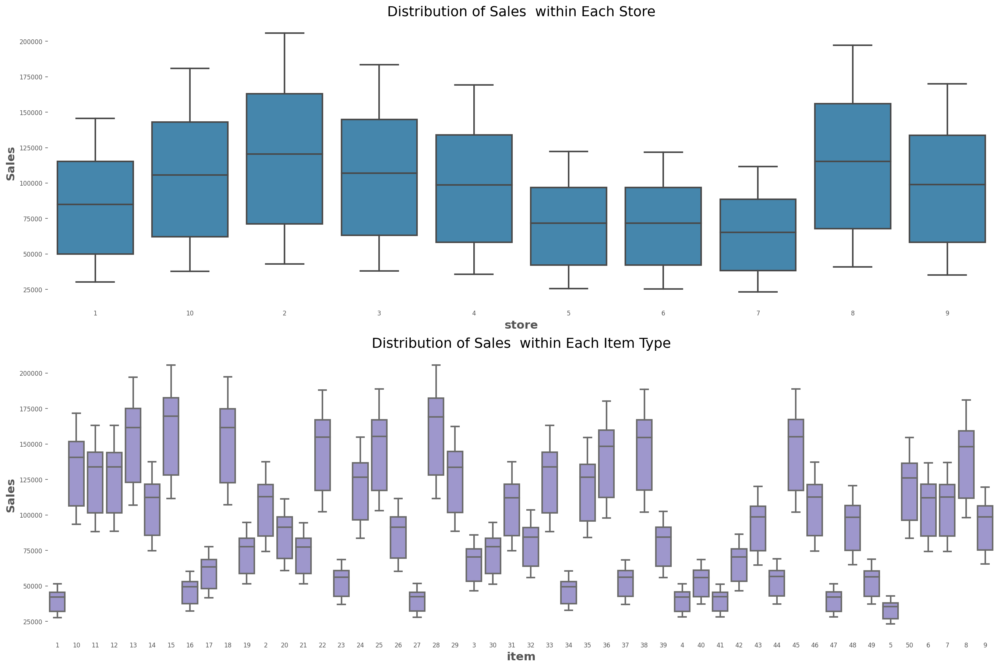

In [24]:
def count_sales(x):
  sales_idx = np.where(x != 0)[0]
  return sum(x[sales_idx])

def plot_sales_distribution_item_store():
  sales = sales_ts.apply(count_sales).to_frame("total_sales").reset_index()
  plot_kwargs = {
    "linewidth": 2,
    "flierprops": {"alpha": 0.5},
}

  fig = plt.figure(figsize=(18, 12))
  ax0 = sns.boxplot(
      data=sales, x="store", y="total_sales",
      color=COLORS[1],
      ax=fig.add_subplot(211),
      **plot_kwargs,
  )
  plt.ylabel("Sales")
  plt.title("Distribution of Sales  within Each Store")

  ax1 = sns.boxplot(
        data=sales, x="item", y="total_sales",
        color=COLORS[2],
        ax=fig.add_subplot(212),
        **plot_kwargs,
    )
  plt.ylabel("Sales")
  plt.title("Distribution of Sales  within Each Item Type")

  plt.tight_layout()
  plt.show()

plot_sales_distribution_item_store()

**Summary: Sales patterns may be affected by date-related features**

Features related to dates, such as the month and year of each data point, are known as future covariates because they are fixed and can be determined beforehand. We use boxplots to examine the sales distribution for each covariate. However, some covariates, such as the days of the year, have a large number of categories (365-366 days in a year), making it difficult to inspect all the boxplots. In these cases, we calculate the average sales for each time period across all target series. We create the following date-related features:

+ `day`. The sales grow multiplicatively with both **trend** and **seasonality**
moving together.

+ `month`. We can see that the sales tend to increase from the beginning of a year to July, followed by a gradual decrease towards December. Moreover, January and December are the two months that experience the least sales, suggesting a **seasonal pattern** in which people prepare early for Christmans or New Year's day (these two days are global).

+ `year`. It is clear from the graph that the sales are multiplicative with increasing **trend** and **seasonality** across years.

+ `day_of_week`. Sales tend to be greater and witness a clear growth towards weekends, which are non-working days for most people. It is reasonable to argue that they have more time to visit the grocery stores, which translates to greater sales.

+ `day_of_year` / `week_of_year`. The days of the year and weeks of the year give similar information to the months, but at different levels of granularity. To illustrate, sales in both the first and last week tend to be considerably small, supporting our supposition above. Moreover, it is noticeable that the sales patterns have weekly seasonalities and shifts in the mean.

+ `date_index`. The date index (index of the target series) gives similar information to the years, but at a **higher level of granularity**.

In [25]:
sales_ts_long = sales_ts_scaled.melt(
    value_name = 'sales',
    ignore_index = False
).reset_index()

df = sales_ts_long.copy().sort_values(['date', 'store', 'item'], ignore_index = True)
df["day"] = df.date.dt.day
df["month"] = df.date.dt.month
df["year"] = df.date.dt.year
df["day_of_wk"] = df.date.dt.dayofweek
df["day_of_yr"] = df.date.dt.dayofyear
df["wk_of_yr"] = df.date.dt.isocalendar().week.astype(int)
df["date_index"] = df.date.factorize()[0]
df['is_month_start'] = (df.date.dt.is_month_start).astype(int)
df['is_month_end'] = (df.date.dt.is_month_end).astype(int)

In [26]:
print_info("Future Date-Related Covariates: day, month, year, day_of_week, day_of_year, week_of_year, date_index, is_month_start, is_month_end")

----------------------------------------------------------------------------------------------------------------------------------
Future Date-Related Covariates: day, month, year, day_of_week, day_of_year, week_of_year, date_index, is_month_start, is_month_end
----------------------------------------------------------------------------------------------------------------------------------


In [27]:
def plot_sales_date_dist():
  plot_kwargs = {
        "linewidth": 2,
        "flierprops": {"alpha": 0.2},
        "orient": "h",
    }

  fig = plt.figure(figsize = (18,12))
  gs = fig.add_gridspec(5, 2, height_ratios = (3, 5, 2, 5, 5))

  sns.boxplot(
        data=df,
        y="day_of_wk",
        x="sales",
        color=COLORS[0],
        ax=fig.add_subplot(gs[0, 0]),
        **plot_kwargs,
    )

  plt.title("Distribution of Sales across the Days of the Week")

  sns.boxplot(
      data=df,
      y="month",
      x="sales",
      color=COLORS[1],
      ax=fig.add_subplot(gs[1, 0]),
      **plot_kwargs,
  )
  plt.title("Distribution of Sales across the Months")

  sns.boxplot(
      data=df,
      y="year",
      x="sales",
      color=COLORS[2],
      ax=fig.add_subplot(gs[2, 0]),
      **plot_kwargs,
  )
  plt.title("Distribution of Sales across the Years")

  sns.boxplot(
      data=df,
      y="day",
      x="sales",
      color=COLORS[3],
      ax=fig.add_subplot(gs[:3, 1]),
      **plot_kwargs,
  )
  plt.title("Distribution of Sales across the Days of the Month")

  sns.lineplot(
      data=df.groupby("day_of_yr").sales.mean().reset_index(),
      x="day_of_yr",
      y="sales",
      color=COLORS[4],
      ax=fig.add_subplot(gs[3, 0]),
      linewidth=2,
  )
  plt.ylabel("Average Sales")
  plt.title("Average Sales across the Days of the Year")

  sns.lineplot(
      data=df.groupby("wk_of_yr").sales.mean().reset_index(),
      x="wk_of_yr",
      y="sales",
      color=COLORS[5],
      ax=fig.add_subplot(gs[3, 1]),
      linewidth=2,
  )
  plt.ylabel("Average Sales")
  plt.title("Average Sales across the Weeks of the Year")

  sns.lineplot(
      data=df.groupby("date_index").sales.mean().reset_index(),
      x="date_index",
      y="sales",
      color=COLORS[6],
      ax=fig.add_subplot(gs[4, :]),
      linewidth=2,
  )
  plt.ylabel("Average Sales")
  plt.title("Average Sales across the Date Index")

  plt.tight_layout()
  plt.show()

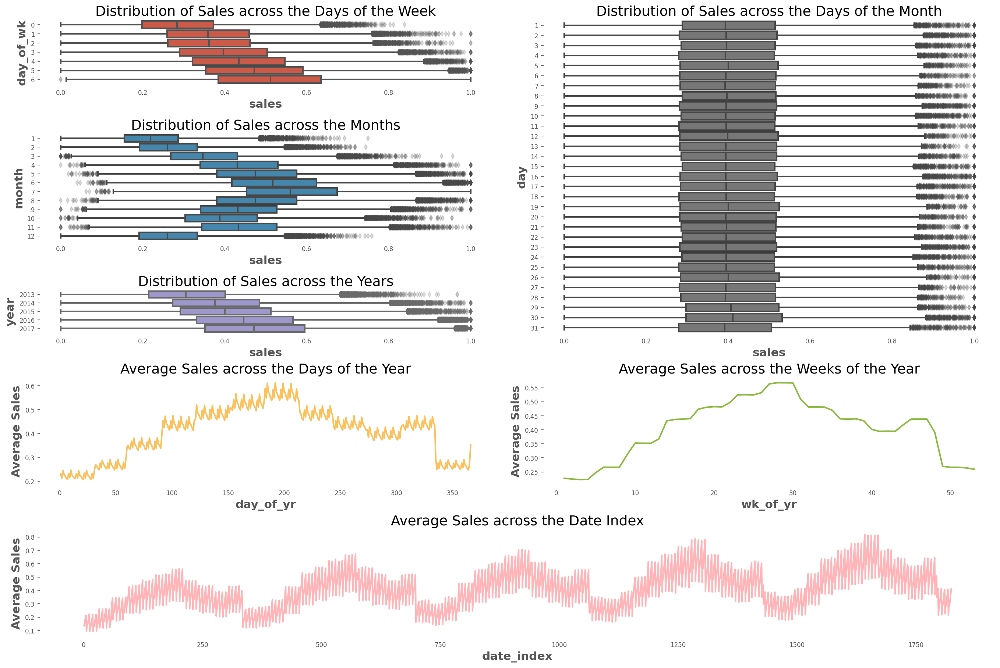

In [28]:
plot_sales_date_dist()

### **Checking Seasonality Using ACF (Darts Library)**

The ACF presents a spike at x in [1, 7, 14, 21], which suggests a weekly seasonality trend (highlighted). The blue zone determines the significance of the statistics for a confidence level of $\alpha = 5\%$. We can also run a statistical check of seasonality for each candidate period `m` or the seasonal decomposition using STL.

In [29]:
total_sales_per_date = item_sales_per_date.groupby(["date"])["sales"].aggregate("sum").reset_index()

In [30]:
seasonality_check_data = total_sales_per_date
seasonality_check_data = seasonality_check_data.set_index("date")
seasonality_check_data_series = TimeSeries.from_times_and_values(seasonality_check_data.index, seasonality_check_data["sales"].values)

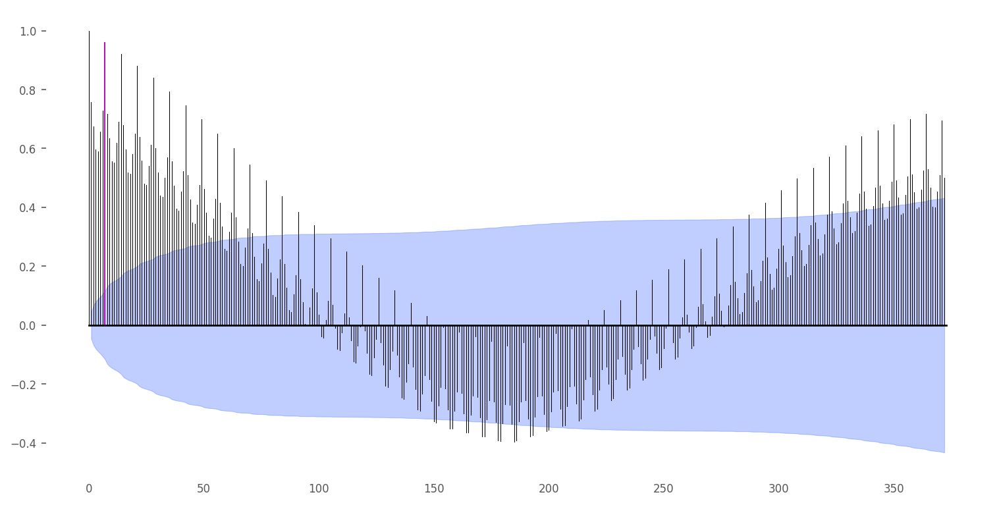

In [31]:
plot_acf(seasonality_check_data_series, m=7, alpha=0.05, max_lag=12*31)

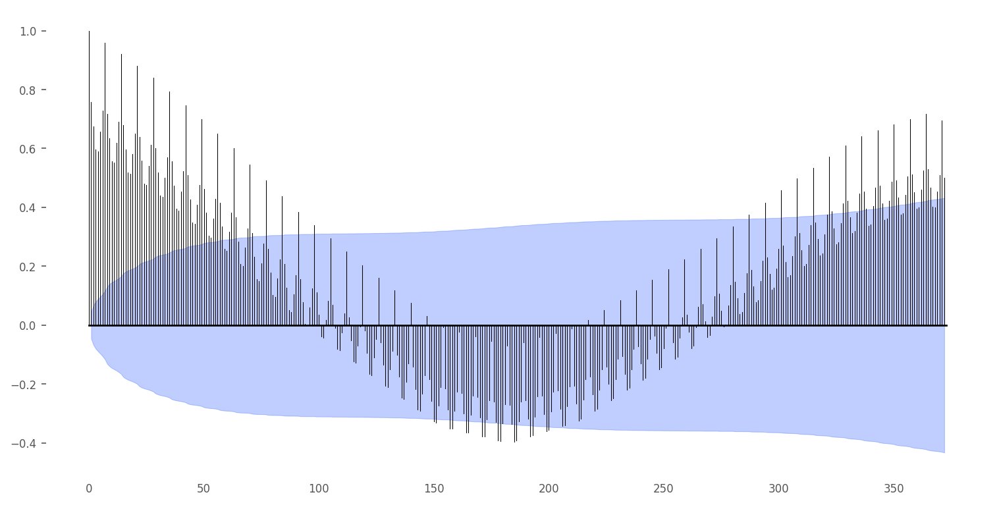

In [32]:
plot_acf(seasonality_check_data_series, m=365.25, alpha=0.05, max_lag=12*31)

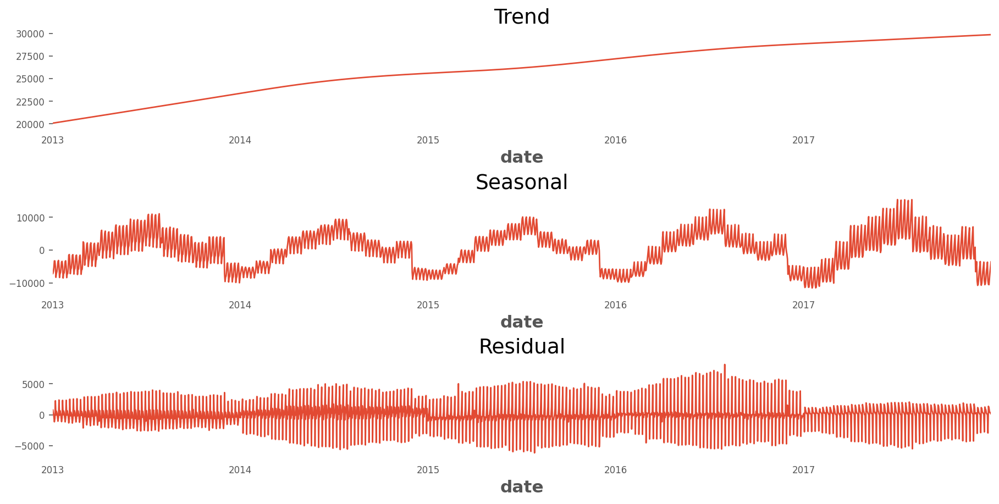

In [33]:
from statsmodels.tsa.seasonal import STL
decomp = STL(seasonality_check_data.sales, period = 365).fit()
fig, ax = plt.subplots(3,1, figsize=(12,6))
decomp.trend.plot(title='Trend', ax=ax[0])
decomp.seasonal.plot(title='Seasonal', ax=ax[1])
decomp.resid.plot(title='Residual', ax=ax[2])
plt.tight_layout()
plt.show()

In [34]:
# trend_seasonal = extract_trend_and_seasonality(seasonality_check_data_series, freq = 7,
#                               model = ModelMode.ADDITIVE, method = "STL")

### **Selecting Subset of Data**

For simplicity & speed, we will only keep (randomly) data from the last two stores out of the 10 stores

In [35]:
# dataset = dataset.loc[(dataset["store_item"].str.startswith('9')) | (dataset["store_item"].str.startswith('10'))].sort_values(["date", "store_item"]).reset_index(drop = True)

In [36]:
# dataset = dataset.loc[(dataset["store_item"].str.startswith('8'))].sort_values(["date", "store_item"]).reset_index(drop = True)

# **Modeling**

## **Dataset Preparation**

In [37]:
# Rename columns to match the NixtlaVerse's expectations
# The 'store_item' becomes 'unique_id' representing the unique identifier of the time series
# The 'date' becomes 'ds' representing the time stamp of the data points
# The 'sales' becomes 'y' representing the target variable we want to forecast
# Y_df = dataset.query('unique_id.str.startswith("6_46")').copy()

Y_df = dataset.copy()
# Y_df = Y_df.reset_index()
Y_df = Y_df.rename(columns={
    'store_item': 'unique_id',
    'date': 'ds',
    'sales': 'y'
})
Y_df['y'] = Y_df['y'].astype(int)
# Convert the 'ds' column to datetime format to ensure proper handling of date-related operations in subsequent steps
Y_df['ds'] = pd.to_datetime(Y_df['ds'])
# Convert the 'id' column to string type
Y_df['unique_id'] = Y_df['unique_id'].astype(str)
Y_df.tail()

,ds,unique_id,y
912995,2017-12-31,3_24,100
912996,2017-12-31,3_25,87
912997,2017-12-31,3_26,49
912998,2017-12-31,3_27,32
912999,2017-12-31,3_22,96


## **Train Test Split**

In [38]:
# horizon is the number of days in the future for which we will make a forecast
horizon = 30
# the seasonality window is 7 because we have weekly seasonality
season_length = 7
# the number of days that the model will use to make a forecast
window_size = 6*30

# intervals = ConformalIntervals(h=horizon, n_windows=3)

In [39]:
Y_df_test = Y_df.groupby('unique_id').tail(horizon).copy()
Y_df_train = Y_df.drop(Y_df_test.index)
# Optional for further experiment
# Y_df_test.loc[:, 'y'] = 0
# Y_df_full = pd.concat([Y_df_train, Y_df_test]).sort_values(['unique_id', 'ds'], ignore_index=True)
# Y_df_full.head()

In [40]:
Y_df_test.shape

(15000, 3)

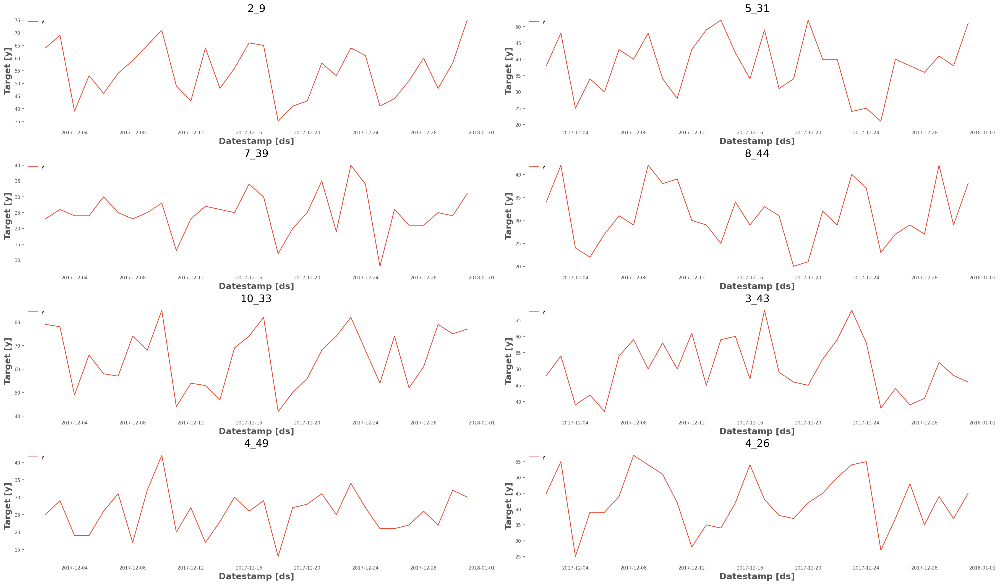

In [41]:
# Feature: plot random series for EDA
sf.plot(Y_df_test)

## **Training Machine Learning Models**

### **Importing Modules**

In [42]:
from mlforecast import MLForecast
from mlforecast.target_transforms import Differences, BaseTargetTransform
from sklearn.preprocessing import FunctionTransformer
from sklearn.base import TransformerMixin, clone

from mlforecast.utils import PredictionIntervals
from numba import njit
from window_ops.expanding import expanding_mean
from window_ops.rolling import seasonal_rolling_mean, rolling_mean, rolling_max

# Import the necessary models from various libraries
# LGBMRegressor: A gradient boosting framework that uses tree-based learning algorithms from the LightGBM library
from lightgbm import LGBMRegressor

# XGBRegressor: A gradient boosting regressor model from the XGBoost library
from xgboost import XGBRegressor

# CatboostRegressor
from catboost import CatBoostRegressor

### **Funtion to Create Lags Features**

In [43]:
@njit
def rolling3d(x):
    return rolling_mean(x, window_size=3)

@njit
def rolling7d(x):
    return rolling_mean(x, window_size=7)

@njit
def rolling14d(x):
    return rolling_mean(x, window_size=14)

@njit
def rolling21d(x):
    return rolling_mean(x, window_size=21)

@njit
def rolling28d(x):
    return rolling_mean(x, window_size=28)


@njit
def rolling_max_1d(x):
  return rolling_max(x, window_size = 1)

@njit
def rolling_max_2d(x):
  return rolling_max(x, window_size = 2)

@njit
def rolling_max_7d(x):
  return rolling_max(x, window_size = 7)

@njit
def rolling_max_14d(x):
  return rolling_max(x, window_size = 14)


@njit
def rolling_max_21d(x):
  return rolling_max(x, window_size = 21)

@njit
def rolling_max_28d(x):
  return rolling_max(x, window_size = 28)

# def seasonal_rolling_4w(x):
#     return seasonal_rolling_mean(x, season_length=7, window_size=4)

### **Target Transformation Class**

In [44]:
class StandardScaler(BaseTargetTransform):
    """Standardizes the series by subtracting their mean and dividing by their standard deviation."""
    def fit_transform(self, df: pd.DataFrame) -> pd.DataFrame:
        self.norm_ = df.groupby(self.id_col)[self.target_col].agg(['mean', 'std'])
        df = df.merge(self.norm_, on=self.id_col)
        df[self.target_col] = (df[self.target_col] - df['mean']) / df['std']
        df = df.drop(columns=['mean', 'std'])
        return df

    def inverse_transform(self, df: pd.DataFrame) -> pd.DataFrame:
        df = df.merge(self.norm_, on=self.id_col)
        for col in df.columns.drop([self.id_col, self.time_col, 'mean', 'std']):
            df[col] = df[col] * df['std'] + df['mean']
        df = df.drop(columns=['std', 'mean'])
        return df


class LogScaler(BaseTargetTransform):
  def fit_transform(self, df:pd.DataFrame) -> pd.DataFrame:
    df[self.target_col] = np.log1p(df[self.target_col])
    return df

  def inverse_transform(self, df:pd.DataFrame) -> pd.DataFrame:
    df[self.target_col] = np.expm1(df[self.target_col])
    return df

class GlobalSklearnTransformer(BaseTargetTransform):
    """Applies the same scikit-learn transformer to all series."""

    def __init__(self, transformer: TransformerMixin):
        self.transformer = transformer

    def fit_transform(self, df: pd.DataFrame) -> pd.DataFrame:
        df = df.copy(deep=False)
        self.transformer_ = clone(self.transformer)
        df[self.target_col] = self.transformer_.fit_transform(
            df[[self.target_col]].values
        )
        return df

logscaler_func = FunctionTransformer(func=np.log1p, inverse_func=np.expm1)

### **Initiate Hyperparameters and MLForecast Object**

In [45]:
lgb_params = {
    'max_depth': 10,
    'verbosity': -1,
    'force_col_wise': True,
    'num_leaves': 60,
    'n_estimators': 50
}
xgb_params = {
    'eta': 0.1,
    'tree_method': 'gpu_hist', #'hist'
    'max_depth': 10,
    'n_estimators': 50,
    'colsample_bytree': 0.3,
    'eval_metric': 'mape',
    'verbosity': 0
}

cat_params = {
    'iterations': 50,
    'bootstrap_type': 'Bayesian',
    'depth': 10,
    'max_ctr_complexity': 6,
    'eval_metric': 'MAE',
    'task_type': 'GPU',
    'verbose': False
}
# Instantiate the MLForecast object
mlf = MLForecast(
    models=[LGBMRegressor(**lgb_params), XGBRegressor(**xgb_params), CatBoostRegressor(**cat_params)],  # List of models for forecasting: LightGBM, XGBoost and Linear Regression
    freq='D',  # Frequency of the data - 'D' for daily frequency
    lags= [1, 2, 3] + [7 * (i+1) for i in range(4)],    # Specific lags to use as regressors: Default - # list(range(1, 7)) -> 1-6 days
    lag_transforms = {
        1:  [expanding_mean, rolling_max_1d],
        2:  [rolling_max_2d],
        3:  [rolling3d],
        7:  [rolling7d, rolling_max_7d],
        14: [rolling14d, rolling_max_14d],
        21: [rolling21d, rolling_max_21d],
        28: [rolling28d, rolling_max_28d]
    },
    # Date features to use as regressors
    date_features=['year', 'month', 'day', 'dayofweek',
                   'quarter', 'week', 'dayofyear',
                   'is_year_start', 'is_year_end'],
    target_transforms = [StandardScaler()]
)

### **Training Models**

In [46]:
# Start the timer to calculate the time taken for fitting the models
init = time()

# Fit the MLForecast models to the data, with prediction intervals set using a window size of window_size days
mlf.fit(Y_df_train,
        prediction_intervals=PredictionIntervals(n_windows = 3,
                                                 window_size=window_size))
        # fitted=True) # fitted = True to keep in-sample forecasts

# Calculate the end time after fitting the models
end = time()

# Print the time taken to fit the MLForecast models, in minutes
print(f'MLForecast Minutes: {(end - init) / 60}')

Default metric period is 5 because MAE is/are not implemented for GPU
Default metric period is 5 because MAE is/are not implemented for GPU


MLForecast Minutes: 6.066729422410329


### **Forecasting**

In [47]:
fcst_mlf_df = mlf.predict(horizon=horizon, level=[90])
predictions = fcst_mlf_df.loc[:, ~fcst_mlf_df.columns.str.contains('lo|hi')]
results = Y_df_test.merge(predictions, on=['unique_id', 'ds'])
results_with_intervals =  Y_df_test.merge(fcst_mlf_df, on=['unique_id', 'ds']) # can use set_index('unique_id')

In [48]:
results_with_intervals.head()

,ds,unique_id,y,LGBMRegressor,XGBRegressor,CatBoostRegressor,LGBMRegressor-lo-90,LGBMRegressor-hi-90,XGBRegressor-lo-90,XGBRegressor-hi-90,CatBoostRegressor-lo-90,CatBoostRegressor-hi-90
0,2017-12-02,10_1,19,24.407611,21.996161,23.203886,16.969797,31.845426,15.137321,28.855001,14.116480,32.291292
1,2017-12-02,6_47,19,15.080841,14.999697,17.116368,4.417294,25.744388,6.268489,23.730905,5.945747,28.286989
2,2017-12-02,6_46,51,44.349263,42.280610,42.424457,38.933386,49.765140,37.380377,47.180844,36.939187,47.909727
3,2017-12-02,6_45,53,59.944023,60.294254,60.062987,54.552048,65.335997,55.870198,64.718309,55.351946,64.774028
4,2017-12-02,6_44,28,20.542999,20.800643,21.496909,5.620250,35.465748,8.346031,33.255255,9.275189,33.718628


In [49]:
results.to_csv('sales_forecast_all.csv')

### **Forecasts Evaluation**

In [50]:
from datasetsforecast.losses import *
from typing import Any, Callable, Dict, List, Optional, Union
from functools import partial
from inspect import signature

#### **Function to Compute Accuracy Metric**

In [51]:
point_metrics = [mse, rmse, mae]

def evaluate_point_forecast(df: pd.DataFrame, metrics: List[Callable], level: Optional[List] = None) -> pd.DataFrame:
    id_ts = list(df['unique_id'].unique())
    eval_ = {}
    models = df.loc[:, ~df.columns.str.contains('unique_id|y|ds|cutoff|lo|hi')].columns
    # df_new = df.loc[:, ~df.columns.str.contains('cutoff|lo|hi')]
    for model in models:
        # print(f"Current Model: {model}")
        eval_[model] = {}
        for id in id_ts:
          # print(f"Current time series: {id}")
          metric_dict = {}
          for metric in metrics:
            metric_name = metric.__name__
            # res = df.loc[:, df.columns.str.contains('unique_id|y|ds|' + str(model))].groupby("unique_id").apply(lambda x: metric(x['y'], x[model])).to_frame(metric.__name__)
            y_hat = df.loc[df['unique_id'] == id, df.columns == model].values.flatten()
            # print(y_hat)
            y = df.loc[df['unique_id'] == id, df.columns.str.contains('y')].values.flatten()
            # print(f'Current metric: {metric_name} | Dimension of true value: {y.shape} | Dimension of predicted value: {y_hat.shape}')
            # print(y)
            metric_dict[metric_name] = metric(y, y_hat)

          eval_[model][id] = metric_dict

    model_id = []
    id_ts = []
    for model, ts in eval_.items():
      model_id.append(model)
      id_ts.append(pd.DataFrame.from_dict(ts, orient='index'))

    eval_df = pd.concat(id_ts, keys = model_id)
    eval_df.columns = eval_df.columns.str.upper()
    return eval_df, eval_


#### **Function to Compute Probabilistic Metric**

In [52]:
probabilistic_metrics = [quantile_loss, mqloss, coverage, calibration, scaled_crps]

In [53]:
for metric in probabilistic_metrics:
  print_info(f"Parameters of {metric.__name__}: ", signature(metric).parameters)

-----------------------------
Parameters of quantile_loss: 
-----------------------------
OrderedDict([('y', <Parameter "y: numpy.ndarray">), ('y_hat', <Parameter "y_hat: numpy.ndarray">), ('q', <Parameter "q: float = 0.5">), ('weights', <Parameter "weights: Optional[numpy.ndarray] = None">), ('axis', <Parameter "axis: Optional[int] = None">)])
----------------------
Parameters of mqloss: 
----------------------
OrderedDict([('y', <Parameter "y: numpy.ndarray">), ('y_hat', <Parameter "y_hat: numpy.ndarray">), ('quantiles', <Parameter "quantiles: numpy.ndarray">), ('weights', <Parameter "weights: Optional[numpy.ndarray] = None">), ('axis', <Parameter "axis: Optional[int] = None">)])
------------------------
Parameters of coverage: 
------------------------
OrderedDict([('y', <Parameter "y: numpy.ndarray">), ('y_hat_lo', <Parameter "y_hat_lo: numpy.ndarray">), ('y_hat_hi', <Parameter "y_hat_hi: numpy.ndarray">)])
---------------------------
Parameters of calibration: 
-------------------

In [54]:
probabilistic_metrics = [quantile_loss, mqloss, coverage, calibration, scaled_crps]


def quantiles_from_level(model_name, level):
  """
  Returns quantiles associated to `level` and the sorted columns within `model_name`
  """
  level = sorted(level)
  alphas = [100 - lv for lv in level]
  quantiles = [alpha / 200 for alpha in reversed(alphas)]
  quantiles.extend([1 - alpha / 200 for alpha in alphas])
  cols = [f'{model_name}-lo-{lv}' for lv in reversed(level)]
  cols.extend([f'{model_name}-hi-{lv}' for lv in level])
  return np.array(quantiles), cols

def evaluate_distributional_forecast(df: pd.DataFrame,
                                     metrics: List[Callable],
                                     level: Optional[List] = None) -> pd.DataFrame:
    id_ts = list(df['unique_id'].unique())
    eval_ = {}
    models = df.loc[:, ~df.columns.str.contains('unique_id|y|ds|cutoff|lo|hi')].columns

    for model in models:
        eval_[model] = {}
        for id in id_ts:
          metric_dict = {}
          y = df.loc[df['unique_id'] == id, df.columns.str.contains('y')].values.flatten()

          for metric in metrics:
            metric_name = metric.__name__
            # print(f"Begin computing {metric_name}")
            params = signature(metric).parameters
            if "quantiles" in params:
              if level is None:
                raise Exception(f"Please provide `level` to compute the {metric_name}.")

              quantiles, lv_cols = quantiles_from_level(model_name = model, level = level)
              y_hat_q = df.loc[df['unique_id'] == id, lv_cols].values
              metric_dict[metric_name] = metric(y, y_hat_q, quantiles = quantiles)
            # res = df.loc[:, df.columns.str.contains('unique_id|y|ds|' + str(model))].groupby("unique_id").apply(lambda x: metric(x['y'], x[model])).to_frame(metric.__name__)
            elif ('y_hat_lo' in params) and ('y_hat_hi' in params):
              if level is None:
                raise Exception(f"Please provide `level` to compute the {metric_name}.")
              for lv in level:
                y_hat_lo = df.loc[df['unique_id'] == id, f'{model}-lo-{lv}'].values
                y_hat_hi = df.loc[df['unique_id'] == id, f'{model}-hi-{lv}'].values
                metric_dict[f'{metric_name}-lv-{lv}'] = metric(y, y_hat_lo, y_hat_hi)
            elif 'y_hat_hi' in params:
              if level is None:
                raise Exception(f'Please provide the `level` argument to compute {metric_name}.')

              quantiles, lv_cols = quantiles_from_level(model_name = model, level = level)
              for q, lv_col in zip(quantiles, lv_cols):
                y_hat_q = df.loc[df['unique_id'] == id, lv_col].values
                metric_dict[f'{metric_name}-q-{q}'] = metric(y, y_hat_q)

            elif 'q' in params:
              if level is None:
                raise Exception(f'Please provide the `level` argument to compute {metric_name}.')

              quantiles, lv_cols = quantiles_from_level(model_name = model, level = level)
              for q, lv_col in zip(quantiles, lv_cols):
                y_hat_q = df.loc[df['unique_id'] == id, lv_col].values
                metric_dict[f'{metric_name}-q-{q}'] = metric(y, y_hat_q, q=q)

            # print(f"Finish computing {metric_name}")

          eval_[model][id] = metric_dict

    model_id = []
    id_ts = []
    for model, ts in eval_.items():
      model_id.append(model)
      id_ts.append(pd.DataFrame.from_dict(ts, orient='index'))

    eval_df = pd.concat(id_ts, keys = model_id)
    eval_df.columns = eval_df.columns.str.upper()
    return eval_df, eval_

In [55]:
acc_ml_df, acc_ml_dict = evaluate_point_forecast(results, point_metrics)

In [56]:
dist_ml_df, dist_ml_dict = evaluate_distributional_forecast(results_with_intervals, probabilistic_metrics, level = [90])

In [57]:
dist_ml_df

QUANTILE_LOSS-Q-0.05  QUANTILE_LOSS-Q-0.95    MQLOSS  \
LGBMRegressor     10_1              0.782760              0.597982  0.690371   
                  6_47              0.670385              0.686940  0.678663   
                  6_46              0.827031              0.552403  0.689717   
                  6_45              1.668036              0.659732  1.163884   
                  6_44              0.673458              0.695832  0.684645   
...                                      ...                   ...       ...   
CatBoostRegressor 3_24              1.579697              2.524120  2.051909   
                  3_25              1.653094              1.185320  1.419207   
                  3_26              1.379731              0.767417  1.073574   
                  3_27              0.849999              0.585355  0.717677   
                  3_22              2.563853              0.850428  1.707141   

                        COVERAGE-LV-90  CALIBRATION-Q-0.05  \
LGBMRegressor     10_1       83.333333            0.133333   
                  6_47       96.666667            0.000000   
                  6_46       83.333333            0.100000   
                  6_45       70.000000            0.266667   
                  6_44       90.000000            0.033333   
...                                ...                 ...   
CatBoostRegressor 3_24       60.000000            0.266667   
                  3_25       63.333333            0.266667   
                  3_26       76.666667            0.166667   
                  3_27       90.000000            0.100000   
                  3_22       63.333333            0.300000   

                        CALIBRATION-Q-0.95  SCALED_CRPS  
LGBMRegressor     10_1            0.966667     0.068922  
                  6_47            0.966667     0.088329  
                  6_46            0.933333     0.036111  
                  6_45            0.966667     0.045913  
                  6_44            0.933333     0.071691  
...                                    ...          ...  
CatBoostRegressor 3_24            0.866667     0.061281  
                  3_25            0.900000     0.035114  
                  3_26            0.933333     0.046442  
                  3_27            1.000000     0.067177  
                  3_22            0.933333     0.044322  

[1500 rows x 7 columns]

In [58]:
target_metric = 'SCALED_CRPS'
subset_df = dist_ml_df.reset_index().rename(columns = {'level_0': 'Model', 'level_1': 'Unique_id'})
subset_df['Min_loss'] = subset_df.groupby(['Unique_id'])[target_metric].transform('min')
subset_df.iloc[list(np.where(subset_df['Min_loss'] == subset_df['SCALED_CRPS'])[0])]

,Model,Unique_id,QUANTILE_LOSS-Q-0.05,QUANTILE_LOSS-Q-0.95,MQLOSS,COVERAGE-LV-90,CALIBRATION-Q-0.05,CALIBRATION-Q-0.95,SCALED_CRPS,Min_loss
2,LGBMRegressor,6_46,0.827031,0.552403,0.689717,83.333333,0.100000,0.933333,0.036111,0.036111
3,LGBMRegressor,6_45,1.668036,0.659732,1.163884,70.000000,0.266667,0.966667,0.045913,0.045913
5,LGBMRegressor,6_43,0.758396,0.882677,0.820536,76.666667,0.166667,0.933333,0.049881,0.049881
8,LGBMRegressor,6_40,0.669345,0.558199,0.613772,93.333333,0.033333,0.966667,0.061686,0.061686
13,LGBMRegressor,6_36,1.174165,0.935175,1.054670,86.666667,0.100000,0.966667,0.042699,0.042699
...,...,...,...,...,...,...,...,...,...,...
1485,CatBoostRegressor,3_40,0.887439,0.527482,0.707461,80.000000,0.166667,0.966667,0.049646,0.049646
1487,CatBoostRegressor,3_29,0.929429,1.104496,1.016963,83.333333,0.133333,0.966667,0.029577,0.029577
1488,CatBoostRegressor,3_18,2.690657,1.010626,1.850641,60.000000,0.333333,0.933333,0.045470,0.045470
1490,CatBoostRegressor,3_2,0.464918,0.986810,0.725864,90.000000,0.066667,0.966667,0.025291,0.025291


In [59]:
results_with_intervals.loc[results_with_intervals['unique_id'] == '1_1', 'LGBMRegressor-hi-90'].values.shape

(30,)

##### **Experiment**

In [60]:
# models = results.loc[:, ~results.columns.str.contains('unique_id|y|ds|cutoff|lo|hi')].columns
# results.loc[:, results.columns.str.contains('unique_id|y|ds|LGBM')].groupby("unique_id").apply(lambda x: mae(x['y'], x['LGBMRegressor'])).to_frame('MAE')

In [61]:
temp = results.loc[:, results.columns.str.contains('unique_id|y|ds|LGBM')].groupby(["unique_id", "ds"]).apply(lambda x: mae(x['y'], x['LGBMRegressor'])).to_frame('MAE').reset_index()

In [62]:
temp.head()

,unique_id,ds,MAE
0,10_1,2017-12-02,5.407611
1,10_1,2017-12-03,0.285771
2,10_1,2017-12-04,0.156125
3,10_1,2017-12-05,4.175701
4,10_1,2017-12-06,2.949574


In [63]:
np.sum(temp.loc[temp['unique_id'] == "9_1"]['MAE'].values) / 30

3.5118332874725606

## **Training Deep Learning Models**

### **Importing Modules**

In [64]:
from ray import tune
from ray.tune.search.hyperopt import HyperOptSearch
from neuralforecast import NeuralForecast
from neuralforecast.auto import AutoNHITS, AutoNBEATS
from neuralforecast.losses.pytorch import MQLoss, DistributionLoss, sCRPS

### **Setting Configuratons**

In [65]:
level = np.arange(0, 100 , 2)
qs = [[50-lv/2, 50 + lv/2] if lv!=0 else [50] for lv in level]
quantiles = np.sort(np.concatenate(qs) / 100)

# level = [80, 95]
# level = sorted(level)
# alphas = [100 - lv for lv in level]
# quantiles = [alpha / 200 for alpha in reversed(alphas)]
# quantiles.extend([1 - alpha / 200 for alpha in alphas])

# Previously I set max_steps to be 1000, which makes training last for 30 min with TPU
config_nhits = {
    "input_size": tune.choice([48, 48*2, 48*3, 48*5]),              # Length of input window
    "n_blocks": 5*[1],                                              # Length of input window
    "mlp_units": tune.choice([5 * [[64, 64]], 5 * [[128, 128]],
                              5 * [[256, 256]] , 5 * [[512, 512]] ]), # Length of input window
    "n_pool_kernel_size": tune.choice([5*[1], 5*[2], 5*[4], 5*[8],
                                      [16, 8, 4, 1, 1],
                                      [8, 4, 2, 1, 1]]),            # MaxPooling Kernel size
    "n_freq_downsample": tune.choice([[8, 4, 2, 1, 1],
                                      [1, 1, 1, 1, 1]]),            # Interpolation expressivity ratios
    "learning_rate": tune.loguniform(1e-4, 1e-2),                   # Initial Learning rate
    "pooling_mode": tune.choice(['MaxPool1d', 'AvgPool1d']),
    "scaler_type": tune.choice([None]),                         # Scaler type
    "max_steps": tune.choice([100]),                               # Max number of training iterations
    "batch_size": tune.choice([32, 64, 128, 256]),                  # Number of series in batch
    "windows_batch_size": tune.choice([128, 256, 512, 1024]),       # Number of windows in batch
    "val_check_steps": 50,
    "random_seed": tune.randint(1, 20)                             # Random seed
}

### **Defining Models**

In [66]:
model = AutoNHITS(h=horizon, config=config_nhits,
                  search_alg=HyperOptSearch(),
                  loss=MQLoss(quantiles = quantiles), # You can set a accuracy metric if not concern the probabilistic aspect
                  # loss = sCRPS(quantiles = quantiles),
                  # valid_loss = sCRPS(quantiles = quantiles),
                  num_samples=20)

### **Training Model**

In [67]:
# Start the timer to calculate the time taken for fitting the models
init = time()

nf = NeuralForecast(models=[model], freq='D')
nf.fit(df=Y_df_train, val_size=30)

# Calculate the end time after fitting the models
end = time()
print(f'NeuralForecast Minutes: {(end - init) / 60}')

2023-08-29 04:55:15,597	INFO worker.py:1621 -- Started a local Ray instance.
2023-08-29 04:55:19,089	INFO tune.py:226 -- Initializing Ray automatically. For cluster usage or custom Ray initialization, call `ray.init(...)` before `Tuner(...)`.
2023-08-29 04:55:19,098	INFO tune.py:666 -- [output] This will use the new output engine with verbosity 0. To disable the new output and use the legacy output engine, set the environment variable RAY_AIR_NEW_OUTPUT=0. For more information, please see https://github.com/ray-project/ray/issues/36949


+--------------------------------------------------------------------+
| Configuration for experiment     _train_tune_2023-08-29_04-55-09   |
+--------------------------------------------------------------------+
| Search algorithm                 SearchGenerator                   |
| Scheduler                        FIFOScheduler                     |
| Number of trials                 20                                |
+--------------------------------------------------------------------+

View detailed results here: /root/ray_results/_train_tune_2023-08-29_04-55-09
To visualize your results with TensorBoard, run: `tensorboard --logdir /root/ray_results/_train_tune_2023-08-29_04-55-09`



(_train_tune pid=4749) Global seed set to 14
(_train_tune pid=4749) 2023-08-29 04:55:26.102084: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
(_train_tune pid=4749) To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
(_train_tune pid=4749) 2023-08-29 04:55:27.151882: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT


Epoch 3:   0%|          | 0/16 [00:00<?, ?it/s, v_num=0, train_loss_step=4.080, train_loss_epoch=4.200]
(_train_tune pid=4749) 
Validation: 0it [00:00, ?it/s]
(_train_tune pid=4749) 
Validation DataLoader 0:   0%|          | 0/16 [00:00<?, ?it/s]
(_train_tune pid=4749) 
Epoch 3:   0%|          | 0/16 [00:00<?, ?it/s, v_num=0, train_loss_step=4.170, train_loss_epoch=4.200, valid_loss=4.090]
                                                                        
Epoch 6:   0%|          | 0/16 [00:00<?, ?it/s, v_num=0, train_loss_step=4.010, train_loss_epoch=4.170, valid_loss=4.090]


2023-08-29 04:55:54,183	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'mlp_units': ((64, 64), (64, 64), (64, 64), (64, 64), (64, 64)), 'n_blocks': (1, 1, 1, 1, 1), 'n_freq_downsample': (8, 4, 2, 1, 1), 'n_pool_kernel_size': (4, 4, 4, 4, 4), 'valid_loss': ('__ref_ph', '004b9a7a')}


(_train_tune pid=4749) 
Validation: 0it [00:00, ?it/s]
Validation DataLoader 0:   0%|          | 0/16 [00:00<?, ?it/s]
(_train_tune pid=4749) 
Epoch 6:   0%|          | 0/16 [00:00<?, ?it/s, v_num=0, train_loss_step=4.180, train_loss_epoch=3.940, valid_loss=4.060]


(_train_tune pid=4749) Global seed set to 16


Epoch 12:   0%|          | 0/4 [00:00<?, ?it/s, v_num=0, train_loss_step=3.730, train_loss_epoch=4.240]
(_train_tune pid=4749) 
Validation: 0it [00:00, ?it/s]
Validation DataLoader 0:   0%|          | 0/4 [00:00<?, ?it/s]
(_train_tune pid=4749) 
Epoch 12:   0%|          | 0/4 [00:00<?, ?it/s, v_num=0, train_loss_step=4.320, train_loss_epoch=4.240, valid_loss=4.020]
                                                                      
Epoch 24:   0%|          | 0/4 [00:00<?, ?it/s, v_num=0, train_loss_step=4.320, train_loss_epoch=4.340, valid_loss=4.020]


2023-08-29 04:56:00,083	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'mlp_units': ((64, 64), (64, 64), (64, 64), (64, 64), (64, 64)), 'n_blocks': (1, 1, 1, 1, 1), 'n_freq_downsample': (1, 1, 1, 1, 1), 'n_pool_kernel_size': (8, 8, 8, 8, 8), 'valid_loss': ('__ref_ph', '004b9a7a')}


Epoch 24: 100%|██████████| 4/4 [00:00<00:00, 18.83it/s, v_num=0, train_loss_step=4.580, train_loss_epoch=4.340, valid_loss=4.020]
Validation: 0it [00:00, ?it/s]
Validation DataLoader 0:   0%|          | 0/4 [00:00<?, ?it/s]
(_train_tune pid=4749) 
Epoch 24: 100%|██████████| 4/4 [00:00<00:00, 11.88it/s, v_num=0, train_loss_step=4.580, train_loss_epoch=4.250, valid_loss=4.020]


(_train_tune pid=4749) Global seed set to 18


Sanity Checking: 0it [00:00, ?it/s]
Epoch 12:   0%|          | 0/4 [00:00<?, ?it/s, v_num=0, train_loss_step=4.230, train_loss_epoch=4.260]
(_train_tune pid=4749) 
Validation: 0it [00:00, ?it/s]
Validation DataLoader 0:   0%|          | 0/4 [00:00<?, ?it/s]
(_train_tune pid=4749) 
Epoch 12:   0%|          | 0/4 [00:00<?, ?it/s, v_num=0, train_loss_step=3.770, train_loss_epoch=4.260, valid_loss=4.080]
                                                                      
Epoch 24:   0%|          | 0/4 [00:00<?, ?it/s, v_num=0, train_loss_step=4.490, train_loss_epoch=4.180, valid_loss=4.080]


2023-08-29 04:56:05,148	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'mlp_units': ((256, 256), (256, 256), (256, 256), (256, 256), (256, 256)), 'n_blocks': (1, 1, 1, 1, 1), 'n_freq_downsample': (1, 1, 1, 1, 1), 'n_pool_kernel_size': (4, 4, 4, 4, 4), 'valid_loss': ('__ref_ph', '004b9a7a')}


Epoch 24: 100%|██████████| 4/4 [00:00<00:00, 22.81it/s, v_num=0, train_loss_step=4.130, train_loss_epoch=4.180, valid_loss=4.080]
Validation: 0it [00:00, ?it/s]
Validation DataLoader 0:   0%|          | 0/4 [00:00<?, ?it/s]
(_train_tune pid=4749) 
Epoch 24: 100%|██████████| 4/4 [00:00<00:00, 15.43it/s, v_num=0, train_loss_step=4.130, train_loss_epoch=3.960, valid_loss=3.810]


(_train_tune pid=4749) Global seed set to 13


Sanity Checking: 0it [00:00, ?it/s]
Epoch 6:   0%|          | 0/8 [00:00<?, ?it/s, v_num=0, train_loss_step=4.740, train_loss_epoch=4.960]
(_train_tune pid=4749) 
Validation: 0it [00:00, ?it/s]
Validation DataLoader 0:   0%|          | 0/8 [00:00<?, ?it/s]
(_train_tune pid=4749) 
Epoch 6:   0%|          | 0/8 [00:00<?, ?it/s, v_num=0, train_loss_step=5.170, train_loss_epoch=4.960, valid_loss=4.630]
                                                                       
Epoch 12:   0%|          | 0/8 [00:00<?, ?it/s, v_num=0, train_loss_step=4.410, train_loss_epoch=4.420, valid_loss=4.630]


2023-08-29 04:56:15,774	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'mlp_units': ((128, 128), (128, 128), (128, 128), (128, 128), (128, 128)), 'n_blocks': (1, 1, 1, 1, 1), 'n_freq_downsample': (8, 4, 2, 1, 1), 'n_pool_kernel_size': (8, 4, 2, 1, 1), 'valid_loss': ('__ref_ph', '004b9a7a')}


(_train_tune pid=4749) 
Validation: 0it [00:00, ?it/s]
Validation DataLoader 0:   0%|          | 0/8 [00:00<?, ?it/s]
(_train_tune pid=4749) 
Epoch 12:   0%|          | 0/8 [00:00<?, ?it/s, v_num=0, train_loss_step=4.400, train_loss_epoch=4.310, valid_loss=4.270]


(_train_tune pid=4749) Global seed set to 4


Epoch 3:   0%|          | 0/16 [00:00<?, ?it/s, v_num=0, train_loss_step=4.270, train_loss_epoch=4.230]
(_train_tune pid=4749) 
Validation: 0it [00:00, ?it/s]
Validation DataLoader 0:   0%|          | 0/16 [00:00<?, ?it/s]
(_train_tune pid=4749) 
Epoch 3:   0%|          | 0/16 [00:00<?, ?it/s, v_num=0, train_loss_step=3.800, train_loss_epoch=4.230, valid_loss=4.080]
                                                                        
Epoch 6:   0%|          | 0/16 [00:00<?, ?it/s, v_num=0, train_loss_step=4.530, train_loss_epoch=4.170, valid_loss=4.080]


2023-08-29 04:56:22,710	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'mlp_units': ((128, 128), (128, 128), (128, 128), (128, 128), (128, 128)), 'n_blocks': (1, 1, 1, 1, 1), 'n_freq_downsample': (1, 1, 1, 1, 1), 'n_pool_kernel_size': (8, 4, 2, 1, 1), 'valid_loss': ('__ref_ph', '004b9a7a')}


(_train_tune pid=4749) 
Validation: 0it [00:00, ?it/s]
Validation DataLoader 0:   0%|          | 0/16 [00:00<?, ?it/s]
(_train_tune pid=4749) 
Epoch 6:   0%|          | 0/16 [00:00<?, ?it/s, v_num=0, train_loss_step=4.180, train_loss_epoch=4.330, valid_loss=4.070]


(_train_tune pid=4749) Global seed set to 2


Epoch 3:   0%|          | 0/16 [00:00<?, ?it/s, v_num=0, train_loss_step=4.730, train_loss_epoch=4.250]
(_train_tune pid=4749) 
Validation: 0it [00:00, ?it/s]
Validation DataLoader 0:   0%|          | 0/16 [00:00<?, ?it/s]
(_train_tune pid=4749) 
Epoch 3:   0%|          | 0/16 [00:00<?, ?it/s, v_num=0, train_loss_step=4.410, train_loss_epoch=4.250, valid_loss=4.080]
                                                                         
Epoch 6:   0%|          | 0/16 [00:00<?, ?it/s, v_num=0, train_loss_step=4.340, train_loss_epoch=4.190, valid_loss=4.080]
(_train_tune pid=4749) 
Validation: 0it [00:00, ?it/s]
Validation DataLoader 0:   0%|          | 0/16 [00:00<?, ?it/s]


2023-08-29 04:56:26,289	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'mlp_units': ((512, 512), (512, 512), (512, 512), (512, 512), (512, 512)), 'n_blocks': (1, 1, 1, 1, 1), 'n_freq_downsample': (8, 4, 2, 1, 1), 'n_pool_kernel_size': (8, 8, 8, 8, 8), 'valid_loss': ('__ref_ph', '004b9a7a')}


(_train_tune pid=4749) 
Epoch 6:   0%|          | 0/16 [00:00<?, ?it/s, v_num=0, train_loss_step=4.820, train_loss_epoch=4.270, valid_loss=4.090]


(_train_tune pid=4749) Global seed set to 3


Epoch 6:   0%|          | 0/8 [00:00<?, ?it/s, v_num=0, train_loss_step=4.050, train_loss_epoch=4.100]
Validation: 0it [00:00, ?it/s]
(_train_tune pid=4749) 
Epoch 6:   0%|          | 0/8 [00:00<?, ?it/s, v_num=0, train_loss_step=3.890, train_loss_epoch=4.100, valid_loss=4.080]
                                                                       
Epoch 12:   0%|          | 0/8 [00:00<?, ?it/s, v_num=0, train_loss_step=4.010, train_loss_epoch=4.100, valid_loss=4.080]


2023-08-29 04:56:29,779	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'mlp_units': ((128, 128), (128, 128), (128, 128), (128, 128), (128, 128)), 'n_blocks': (1, 1, 1, 1, 1), 'n_freq_downsample': (8, 4, 2, 1, 1), 'n_pool_kernel_size': (8, 4, 2, 1, 1), 'valid_loss': ('__ref_ph', '004b9a7a')}


(_train_tune pid=4749) 
Validation: 0it [00:00, ?it/s]
Validation DataLoader 0:   0%|          | 0/8 [00:00<?, ?it/s]
(_train_tune pid=4749) 
Epoch 0:   0%|          | 0/4 [00:00<?, ?it/s] 


(_train_tune pid=4749) Global seed set to 11


Epoch 12:   0%|          | 0/4 [00:00<?, ?it/s, v_num=0, train_loss_step=4.130, train_loss_epoch=4.160]
(_train_tune pid=4749) 
Validation: 0it [00:00, ?it/s]
Validation DataLoader 0:   0%|          | 0/4 [00:00<?, ?it/s]
(_train_tune pid=4749) 
Epoch 12:   0%|          | 0/4 [00:00<?, ?it/s, v_num=0, train_loss_step=4.090, train_loss_epoch=4.160, valid_loss=4.100]
                                                                      
Epoch 24:   0%|          | 0/4 [00:00<?, ?it/s, v_num=0, train_loss_step=3.980, train_loss_epoch=4.190, valid_loss=4.100]


2023-08-29 04:56:35,553	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'mlp_units': ((64, 64), (64, 64), (64, 64), (64, 64), (64, 64)), 'n_blocks': (1, 1, 1, 1, 1), 'n_freq_downsample': (1, 1, 1, 1, 1), 'n_pool_kernel_size': (8, 8, 8, 8, 8), 'valid_loss': ('__ref_ph', '004b9a7a')}


Epoch 24: 100%|██████████| 4/4 [00:00<00:00, 18.60it/s, v_num=0, train_loss_step=4.110, train_loss_epoch=4.190, valid_loss=4.100]
Validation: 0it [00:00, ?it/s]
Validation DataLoader 0:   0%|          | 0/4 [00:00<?, ?it/s]
(_train_tune pid=4749) 
Epoch 24: 100%|██████████| 4/4 [00:00<00:00, 11.73it/s, v_num=0, train_loss_step=4.110, train_loss_epoch=4.280, valid_loss=3.960]


(_train_tune pid=4749) Global seed set to 12


Epoch 3:   0%|          | 0/16 [00:00<?, ?it/s, v_num=0, train_loss_step=4.200, train_loss_epoch=4.170]
(_train_tune pid=4749) 
Validation: 0it [00:00, ?it/s]
Validation DataLoader 0:   0%|          | 0/16 [00:00<?, ?it/s]
(_train_tune pid=4749) 
Epoch 3:   0%|          | 0/16 [00:00<?, ?it/s, v_num=0, train_loss_step=3.900, train_loss_epoch=4.170, valid_loss=4.020]
                                                                         
Epoch 6:   0%|          | 0/16 [00:00<?, ?it/s, v_num=0, train_loss_step=3.560, train_loss_epoch=4.120, valid_loss=4.020]


2023-08-29 04:56:42,991	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'mlp_units': ((512, 512), (512, 512), (512, 512), (512, 512), (512, 512)), 'n_blocks': (1, 1, 1, 1, 1), 'n_freq_downsample': (1, 1, 1, 1, 1), 'n_pool_kernel_size': (8, 8, 8, 8, 8), 'valid_loss': ('__ref_ph', '004b9a7a')}


(_train_tune pid=4749) 
Validation: 0it [00:00, ?it/s]
Validation DataLoader 0:   0%|          | 0/16 [00:00<?, ?it/s]
(_train_tune pid=4749) 
Epoch 6:   0%|          | 0/16 [00:00<?, ?it/s, v_num=0, train_loss_step=4.260, train_loss_epoch=4.090, valid_loss=4.080]


(_train_tune pid=4749) Global seed set to 18


Epoch 12:   0%|          | 0/4 [00:00<?, ?it/s, v_num=0, train_loss_step=4.260, train_loss_epoch=4.210]
(_train_tune pid=4749) 
Validation: 0it [00:00, ?it/s]
(_train_tune pid=4749) 
Epoch 12:   0%|          | 0/4 [00:00<?, ?it/s, v_num=0, train_loss_step=3.990, train_loss_epoch=4.210, valid_loss=4.040]
                                                                      
Epoch 24: 100%|██████████| 4/4 [00:00<00:00,  7.54it/s, v_num=0, train_loss_step=3.510, train_loss_epoch=3.420, valid_loss=4.040]
Validation: 0it [00:00, ?it/s]
Validation DataLoader 0:   0%|          | 0/4 [00:00<?, ?it/s]


2023-08-29 04:56:56,611	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'mlp_units': ((512, 512), (512, 512), (512, 512), (512, 512), (512, 512)), 'n_blocks': (1, 1, 1, 1, 1), 'n_freq_downsample': (1, 1, 1, 1, 1), 'n_pool_kernel_size': (1, 1, 1, 1, 1), 'valid_loss': ('__ref_ph', '004b9a7a')}


(_train_tune pid=4749) 
Epoch 24: 100%|██████████| 4/4 [00:00<00:00,  6.24it/s, v_num=0, train_loss_step=3.510, train_loss_epoch=3.290, valid_loss=3.740]


(_train_tune pid=4749) Global seed set to 4


Epoch 12:   0%|          | 0/4 [00:00<?, ?it/s, v_num=0, train_loss_step=5.490, train_loss_epoch=5.680]
(_train_tune pid=4749) 
Validation: 0it [00:00, ?it/s]
Validation DataLoader 0:   0%|          | 0/4 [00:00<?, ?it/s]
(_train_tune pid=4749) 
Epoch 12:   0%|          | 0/4 [00:00<?, ?it/s, v_num=0, train_loss_step=5.870, train_loss_epoch=5.680, valid_loss=5.480]
                                                                      
Epoch 24:   0%|          | 0/4 [00:00<?, ?it/s, v_num=0, train_loss_step=5.480, train_loss_epoch=5.310, valid_loss=5.480]


2023-08-29 04:57:04,217	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'mlp_units': ((64, 64), (64, 64), (64, 64), (64, 64), (64, 64)), 'n_blocks': (1, 1, 1, 1, 1), 'n_freq_downsample': (1, 1, 1, 1, 1), 'n_pool_kernel_size': (4, 4, 4, 4, 4), 'valid_loss': ('__ref_ph', '004b9a7a')}


Epoch 24: 100%|██████████| 4/4 [00:00<00:00, 14.30it/s, v_num=0, train_loss_step=5.480, train_loss_epoch=5.310, valid_loss=5.480]
Validation: 0it [00:00, ?it/s]
Epoch 24: 100%|██████████| 4/4 [00:00<00:00, 10.81it/s, v_num=0, train_loss_step=5.480, train_loss_epoch=5.170, valid_loss=5.020]


(_train_tune pid=4749) Global seed set to 13


Epoch 12:   0%|          | 0/4 [00:00<?, ?it/s, v_num=0, train_loss_step=4.160, train_loss_epoch=4.170]
(_train_tune pid=4749) 
Validation: 0it [00:00, ?it/s]
Validation DataLoader 0:   0%|          | 0/4 [00:00<?, ?it/s]
(_train_tune pid=4749) 
Epoch 12:   0%|          | 0/4 [00:00<?, ?it/s, v_num=0, train_loss_step=4.100, train_loss_epoch=4.170, valid_loss=4.070]
                                                                      
Epoch 24:   0%|          | 0/4 [00:00<?, ?it/s, v_num=0, train_loss_step=3.950, train_loss_epoch=4.040, valid_loss=4.070]


2023-08-29 04:57:24,700	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'mlp_units': ((128, 128), (128, 128), (128, 128), (128, 128), (128, 128)), 'n_blocks': (1, 1, 1, 1, 1), 'n_freq_downsample': (8, 4, 2, 1, 1), 'n_pool_kernel_size': (16, 8, 4, 1, 1), 'valid_loss': ('__ref_ph', '004b9a7a')}


Epoch 24: 100%|██████████| 4/4 [00:00<00:00,  5.06it/s, v_num=0, train_loss_step=4.130, train_loss_epoch=4.040, valid_loss=4.070]
Validation: 0it [00:00, ?it/s]
Validation DataLoader 0: 100%|██████████| 4/4 [00:00<00:00, 72.15it/s]


(_train_tune pid=4749) Global seed set to 2


Epoch 12:   0%|          | 0/4 [00:00<?, ?it/s, v_num=0, train_loss_step=5.060, train_loss_epoch=5.370]
(_train_tune pid=4749) 
Validation: 0it [00:00, ?it/s]
Validation DataLoader 0:   0%|          | 0/4 [00:00<?, ?it/s]
(_train_tune pid=4749) 
Epoch 12:   0%|          | 0/4 [00:00<?, ?it/s, v_num=0, train_loss_step=5.260, train_loss_epoch=5.370, valid_loss=5.050]
                                                                      
Epoch 24:   0%|          | 0/4 [00:00<?, ?it/s, v_num=0, train_loss_step=4.870, train_loss_epoch=4.710, valid_loss=5.050]


2023-08-29 04:57:47,709	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'mlp_units': ((64, 64), (64, 64), (64, 64), (64, 64), (64, 64)), 'n_blocks': (1, 1, 1, 1, 1), 'n_freq_downsample': (1, 1, 1, 1, 1), 'n_pool_kernel_size': (8, 4, 2, 1, 1), 'valid_loss': ('__ref_ph', '004b9a7a')}


Epoch 24: 100%|██████████| 4/4 [00:00<00:00,  4.40it/s, v_num=0, train_loss_step=4.570, train_loss_epoch=4.710, valid_loss=5.050]
Validation: 0it [00:00, ?it/s]
Validation DataLoader 0:   0%|          | 0/4 [00:00<?, ?it/s]


(_train_tune pid=4749) Global seed set to 16


(_train_tune pid=4749) 
Epoch 12:   0%|          | 0/4 [00:00<?, ?it/s, v_num=0, train_loss_step=3.970, train_loss_epoch=4.240]
(_train_tune pid=4749) 
Validation: 0it [00:00, ?it/s]
Epoch 12:   0%|          | 0/4 [00:00<?, ?it/s, v_num=0, train_loss_step=4.480, train_loss_epoch=4.240, valid_loss=4.220]
                                                                      
Epoch 24:   0%|          | 0/4 [00:00<?, ?it/s, v_num=0, train_loss_step=4.180, train_loss_epoch=4.200, valid_loss=4.220]


2023-08-29 04:58:08,144	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'mlp_units': ((64, 64), (64, 64), (64, 64), (64, 64), (64, 64)), 'n_blocks': (1, 1, 1, 1, 1), 'n_freq_downsample': (8, 4, 2, 1, 1), 'n_pool_kernel_size': (16, 8, 4, 1, 1), 'valid_loss': ('__ref_ph', '004b9a7a')}


Epoch 24: 100%|██████████| 4/4 [00:00<00:00,  4.91it/s, v_num=0, train_loss_step=4.030, train_loss_epoch=4.200, valid_loss=4.220]
Validation: 0it [00:00, ?it/s]
Validation DataLoader 0:   0%|          | 0/4 [00:00<?, ?it/s]


(_train_tune pid=4749) Global seed set to 17


(_train_tune pid=4749) 
Epoch 6:   0%|          | 0/8 [00:00<?, ?it/s, v_num=0, train_loss_step=4.060, train_loss_epoch=4.140]
(_train_tune pid=4749) 
Validation: 0it [00:00, ?it/s]
Epoch 6:   0%|          | 0/8 [00:00<?, ?it/s, v_num=0, train_loss_step=4.320, train_loss_epoch=4.140, valid_loss=4.050]
                                                                       
Epoch 12:   0%|          | 0/8 [00:00<?, ?it/s, v_num=0, train_loss_step=4.390, train_loss_epoch=4.110, valid_loss=4.050]


2023-08-29 04:58:19,268	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'mlp_units': ((512, 512), (512, 512), (512, 512), (512, 512), (512, 512)), 'n_blocks': (1, 1, 1, 1, 1), 'n_freq_downsample': (8, 4, 2, 1, 1), 'n_pool_kernel_size': (8, 8, 8, 8, 8), 'valid_loss': ('__ref_ph', '004b9a7a')}


(_train_tune pid=4749) 
Validation: 0it [00:00, ?it/s]
Validation DataLoader 0:   0%|          | 0/8 [00:00<?, ?it/s]
(_train_tune pid=4749) 
Epoch 12:   0%|          | 0/8 [00:00<?, ?it/s, v_num=0, train_loss_step=4.280, train_loss_epoch=4.120, valid_loss=4.050]


(_train_tune pid=4749) Global seed set to 4


Epoch 3:   0%|          | 0/16 [00:00<?, ?it/s, v_num=0, train_loss_step=4.420, train_loss_epoch=4.250]
(_train_tune pid=4749) 
Validation: 0it [00:00, ?it/s]
Validation DataLoader 0:   0%|          | 0/16 [00:00<?, ?it/s]
(_train_tune pid=4749) 
Epoch 3:   0%|          | 0/16 [00:00<?, ?it/s, v_num=0, train_loss_step=3.820, train_loss_epoch=4.250, valid_loss=4.100]
                                                                        
Epoch 6:   0%|          | 0/16 [00:00<?, ?it/s, v_num=0, train_loss_step=4.690, train_loss_epoch=4.190, valid_loss=4.100]


2023-08-29 04:58:31,391	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'mlp_units': ((256, 256), (256, 256), (256, 256), (256, 256), (256, 256)), 'n_blocks': (1, 1, 1, 1, 1), 'n_freq_downsample': (1, 1, 1, 1, 1), 'n_pool_kernel_size': (8, 4, 2, 1, 1), 'valid_loss': ('__ref_ph', '004b9a7a')}


(_train_tune pid=4749) 
Validation: 0it [00:00, ?it/s]
Validation DataLoader 0:   0%|          | 0/16 [00:00<?, ?it/s]


(_train_tune pid=4749) Global seed set to 7


(_train_tune pid=4749) 
Epoch 6:   0%|          | 0/8 [00:00<?, ?it/s, v_num=0, train_loss_step=4.510, train_loss_epoch=4.170]
Validation: 0it [00:00, ?it/s]
Validation DataLoader 0:   0%|          | 0/8 [00:00<?, ?it/s]
(_train_tune pid=4749) 
Epoch 6:   0%|          | 0/8 [00:00<?, ?it/s, v_num=0, train_loss_step=3.570, train_loss_epoch=4.170, valid_loss=4.110]
                                                                       
Epoch 12:   0%|          | 0/8 [00:00<?, ?it/s, v_num=0, train_loss_step=4.120, train_loss_epoch=4.030, valid_loss=4.110]


2023-08-29 04:58:35,239	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'mlp_units': ((128, 128), (128, 128), (128, 128), (128, 128), (128, 128)), 'n_blocks': (1, 1, 1, 1, 1), 'n_freq_downsample': (8, 4, 2, 1, 1), 'n_pool_kernel_size': (16, 8, 4, 1, 1), 'valid_loss': ('__ref_ph', '004b9a7a')}


(_train_tune pid=4749) 
Validation: 0it [00:00, ?it/s]
Validation DataLoader 0:   0%|          | 0/8 [00:00<?, ?it/s]
(_train_tune pid=4749) 
Epoch 12:   0%|          | 0/8 [00:00<?, ?it/s, v_num=0, train_loss_step=3.690, train_loss_epoch=4.140, valid_loss=4.100]


(_train_tune pid=4749) Global seed set to 18


Epoch 3:   0%|          | 0/16 [00:00<?, ?it/s, v_num=0, train_loss_step=4.210, train_loss_epoch=4.190]
Validation: 0it [00:00, ?it/s]
(_train_tune pid=4749) 
Validation DataLoader 0:   0%|          | 0/16 [00:00<?, ?it/s]
(_train_tune pid=4749) 
Epoch 3:   0%|          | 0/16 [00:00<?, ?it/s, v_num=0, train_loss_step=3.700, train_loss_epoch=4.190, valid_loss=4.140]
                                                                        
Epoch 6:   0%|          | 0/16 [00:00<?, ?it/s, v_num=0, train_loss_step=3.670, train_loss_epoch=4.100, valid_loss=4.140]
(_train_tune pid=4749) 
Validation: 0it [00:00, ?it/s]
Validation DataLoader 0:   0%|          | 0/16 [00:00<?, ?it/s]


2023-08-29 04:58:39,488	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'mlp_units': ((256, 256), (256, 256), (256, 256), (256, 256), (256, 256)), 'n_blocks': (1, 1, 1, 1, 1), 'n_freq_downsample': (1, 1, 1, 1, 1), 'n_pool_kernel_size': (8, 8, 8, 8, 8), 'valid_loss': ('__ref_ph', '004b9a7a')}


(_train_tune pid=4749) 
Epoch 6:   0%|          | 0/16 [00:00<?, ?it/s, v_num=0, train_loss_step=3.710, train_loss_epoch=3.800, valid_loss=4.080]


(_train_tune pid=4749) Global seed set to 17


Sanity Checking: 0it [00:00, ?it/s]
Epoch 24: 100%|██████████| 2/2 [00:00<00:00,  4.59it/s, v_num=0, train_loss_step=4.240, train_loss_epoch=4.280]
Validation: 0it [00:00, ?it/s]
(_train_tune pid=4749) 
Validation DataLoader 0:   0%|          | 0/2 [00:00<?, ?it/s]
(_train_tune pid=4749) 
Epoch 49:   0%|          | 0/2 [00:00<?, ?it/s, v_num=0, train_loss_step=4.310, train_loss_epoch=4.180, valid_loss=4.140]


2023-08-29 04:59:02,715	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'mlp_units': ((64, 64), (64, 64), (64, 64), (64, 64), (64, 64)), 'n_blocks': (1, 1, 1, 1, 1), 'n_freq_downsample': (8, 4, 2, 1, 1), 'n_pool_kernel_size': (1, 1, 1, 1, 1), 'valid_loss': ('__ref_ph', '004b9a7a')}


Epoch 49: 100%|██████████| 2/2 [00:00<00:00,  4.36it/s, v_num=0, train_loss_step=4.160, train_loss_epoch=4.180, valid_loss=4.140]
Validation: 0it [00:00, ?it/s]
Epoch 49: 100%|██████████| 2/2 [00:00<00:00,  3.70it/s, v_num=0, train_loss_step=4.160, train_loss_epoch=4.180, valid_loss=4.090]
                                                                      
Epoch 49: 100%|██████████| 2/2 [00:00<00:00,  3.62it/s, v_num=0, train_loss_step=4.160, train_loss_epoch=4.150, valid_loss=4.090]


(_train_tune pid=4749) Global seed set to 14


Epoch 24: 100%|██████████| 2/2 [00:00<00:00,  6.99it/s, v_num=0, train_loss_step=3.980, train_loss_epoch=4.170]
Validation: 0it [00:00, ?it/s]
Validation DataLoader 0:   0%|          | 0/2 [00:00<?, ?it/s]
(_train_tune pid=4749) 
Epoch 49:   0%|          | 0/2 [00:00<?, ?it/s, v_num=0, train_loss_step=3.720, train_loss_epoch=3.670, valid_loss=4.060]


2023-08-29 04:59:17,880	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'mlp_units': ((256, 256), (256, 256), (256, 256), (256, 256), (256, 256)), 'n_blocks': (1, 1, 1, 1, 1), 'n_freq_downsample': (1, 1, 1, 1, 1), 'n_pool_kernel_size': (8, 4, 2, 1, 1), 'valid_loss': ('__ref_ph', '004b9a7a')}


Epoch 49: 100%|██████████| 2/2 [00:00<00:00,  7.18it/s, v_num=0, train_loss_step=3.750, train_loss_epoch=3.670, valid_loss=4.060]
Validation: 0it [00:00, ?it/s]
Validation DataLoader 0:   0%|          | 0/2 [00:00<?, ?it/s]
(_train_tune pid=4749) 
Epoch 49: 100%|██████████| 2/2 [00:00<00:00,  5.43it/s, v_num=0, train_loss_step=3.750, train_loss_epoch=3.700, valid_loss=3.690]


INFO:lightning_fabric.utilities.seed:Global seed set to 14


Sanity Checking: 0it [00:00, ?it/s]

Training: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

NeuralForecast Minutes: 4.581156384944916


### **Forecasting**

In [68]:
fcst_dl_df = nf.predict()

Predicting: 0it [00:00, ?it/s]

In [69]:
fcst_dl_df = fcst_dl_df.reset_index().set_index(['unique_id', 'ds'])
fcst_dl_df = fcst_dl_df.rename(columns = lambda x : str(x)[:-2])
fcst_dl_df.columns = fcst_dl_df.columns.str.replace('-medi', '')
fcst_dl_df = fcst_dl_df.reset_index().set_index('unique_id')

## **Merging Forecasts From DL and ML Frameworks**

After forecasting, we check the forecast accuracy of Tree-boosted methods and NHITS. The result concurs with recent reviews on the performance of deep learning in forecasting task, with NHITS being underperformed compared to the boosting models. Furthermore, within the boosted family, CatBoost has proved to have the most consistent forecasts over the other two predecessors XGBoost and LGBM. We will choose forecast from

In [70]:
# ml_dl_fcst_df = fcst_mlf_df.reset_index().merge(fcst_dl_df.loc[:, (fcst_dl_df.columns.str.contains('ds|90')) | (fcst_dl_df.columns == 'AutoNHITS')].reset_index(), how='left', on=['unique_id', 'ds']).drop('index', axis = 1)
full_df_ml_dl = results_with_intervals.merge(fcst_dl_df.loc[:, (fcst_dl_df.columns.str.contains('ds|90')) | (fcst_dl_df.columns == 'AutoNHITS')].reset_index(), how='left', on=['unique_id', 'ds'])

In [71]:
full_df_ml_dl.head()

,ds,unique_id,y,LGBMRegressor,XGBRegressor,CatBoostRegressor,LGBMRegressor-lo-90,LGBMRegressor-hi-90,XGBRegressor-lo-90,XGBRegressor-hi-90,CatBoostRegressor-lo-90,CatBoostRegressor-hi-90,AutoNHITS-lo-90,AutoNHITS,AutoNHITS-hi-90
0,2017-12-02,10_1,19,24.407611,21.996161,23.203886,16.969797,31.845426,15.137321,28.855001,14.116480,32.291292,10.551941,21.838924,32.907913
1,2017-12-02,6_47,19,15.080841,14.999697,17.116368,4.417294,25.744388,6.268489,23.730905,5.945747,28.286989,7.557691,15.524351,22.925406
2,2017-12-02,6_46,51,44.349263,42.280610,42.424457,38.933386,49.765140,37.380377,47.180844,36.939187,47.909727,17.871269,37.182045,55.996246
3,2017-12-02,6_45,53,59.944023,60.294254,60.062987,54.552048,65.335997,55.870198,64.718309,55.351946,64.774028,34.711681,61.345531,88.836815
4,2017-12-02,6_44,28,20.542999,20.800643,21.496909,5.620250,35.465748,8.346031,33.255255,9.275189,33.718628,10.097273,19.881538,29.009764


In [72]:
acc_df_full, acc_dict_full = evaluate_point_forecast(full_df_ml_dl, point_metrics)

In [73]:
acc_df_full

MSE       RMSE        MAE
LGBMRegressor 10_1   19.043701   4.363909   3.659482
              6_47   13.946356   3.734482   3.314285
              6_46   30.065940   5.483242   4.661643
              6_45   51.466018   7.173982   5.674950
              6_44   17.435733   4.175612   3.534310
...                        ...        ...        ...
AutoNHITS     3_24  496.325692  22.278368  17.305183
              3_25  173.824289  13.184244  10.953185
              3_26  119.620904  10.937134   8.282228
              3_27   33.637051   5.799746   4.751882
              3_22  272.144661  16.496808  14.015346

[2000 rows x 3 columns]

In [74]:
subset_df = acc_df_full.reset_index().rename(columns = {'level_0': 'Model', 'level_1': 'Unique_id'})
subset_df['Min_loss'] = subset_df.groupby(['Unique_id'])['MAE'].transform('min')
subset_df.iloc[list(np.where(subset_df['Min_loss'] == subset_df['MAE'])[0])]

,Model,Unique_id,MSE,RMSE,MAE,Min_loss
3,LGBMRegressor,6_45,51.466018,7.173982,5.674950,5.674950
8,LGBMRegressor,6_40,22.872274,4.782497,3.779681,3.779681
9,LGBMRegressor,6_4,15.166577,3.894429,3.005598,3.005598
13,LGBMRegressor,6_36,53.337431,7.303248,5.950297,5.950297
14,LGBMRegressor,6_35,46.758723,6.838035,5.641993,5.641993
...,...,...,...,...,...,...
1491,CatBoostRegressor,3_20,45.791184,6.766918,5.197368,5.197368
1494,CatBoostRegressor,3_23,46.112943,6.790651,5.340163,5.340163
1511,AutoNHITS,6_38,94.754433,9.734189,7.058632,7.058632
1579,AutoNHITS,5_20,32.055723,5.661777,4.562682,4.562682


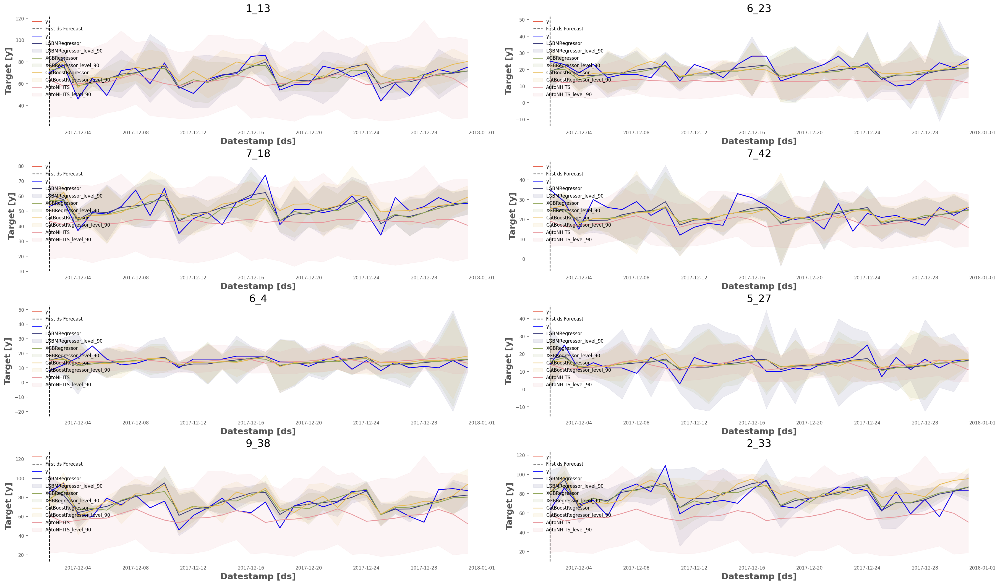

In [75]:
exclude_str = ["lo", "hi", "unique_id", "ds"]
models = [c for c in full_df_ml_dl.columns
    if all(item not in c for item in exclude_str)]
sf.plot(Y_df, full_df_ml_dl, models = models, level = [90], max_insample_length=30)

## **Plotting Point Forecasts Tree-Boosted Regressor**

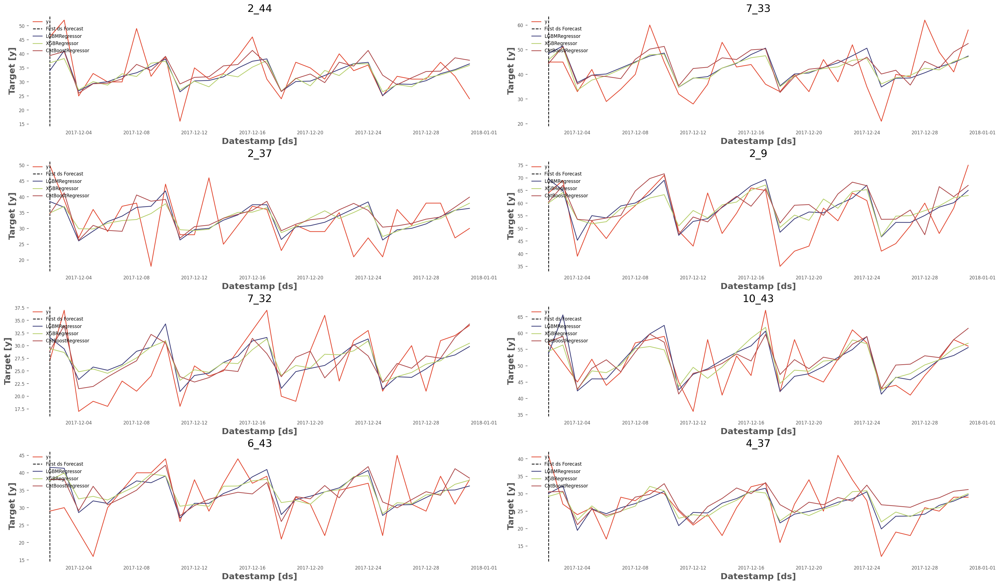

In [76]:
sf.plot(results.loc[:, ~results.columns.str.contains('Regressor')],
        results.loc[:, ~results.columns.str.contains('y')],
        max_insample_length=30)

## **Plotting Probabilistic Forecasts**

### **All ML Models**

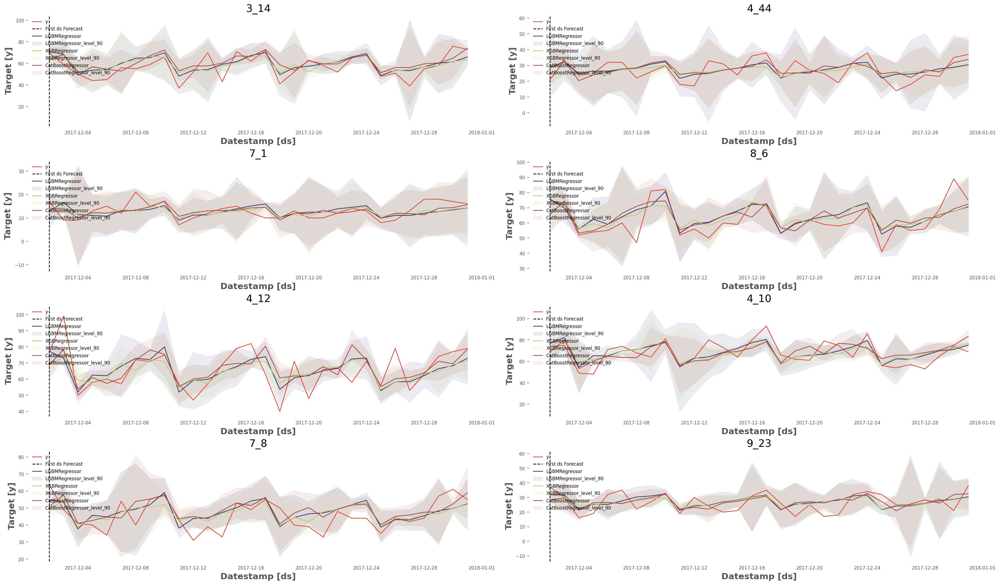

In [77]:
sf.plot(Y_df, fcst_mlf_df.loc[:, fcst_mlf_df.columns.str.contains("unique_id|ds|Regressor")], max_insample_length=30)

### **LGBM**

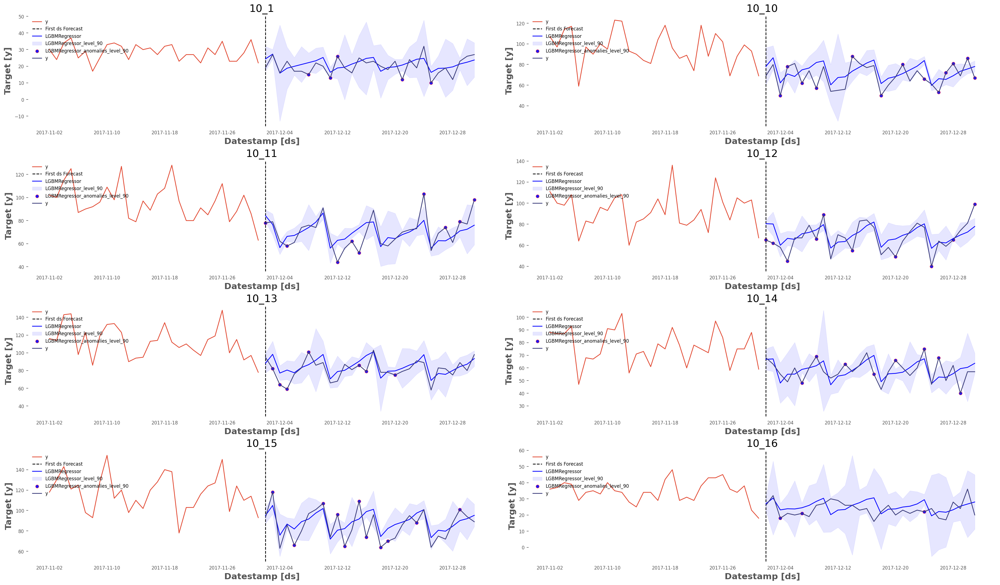

In [78]:
sf.plot(Y_df_train, results_with_intervals,  plot_random=False,
    models=['LGBMRegressor', 'y'],
    level=[90],
    max_insample_length=30,
    plot_anomalies = True
)

### **CatBoost**

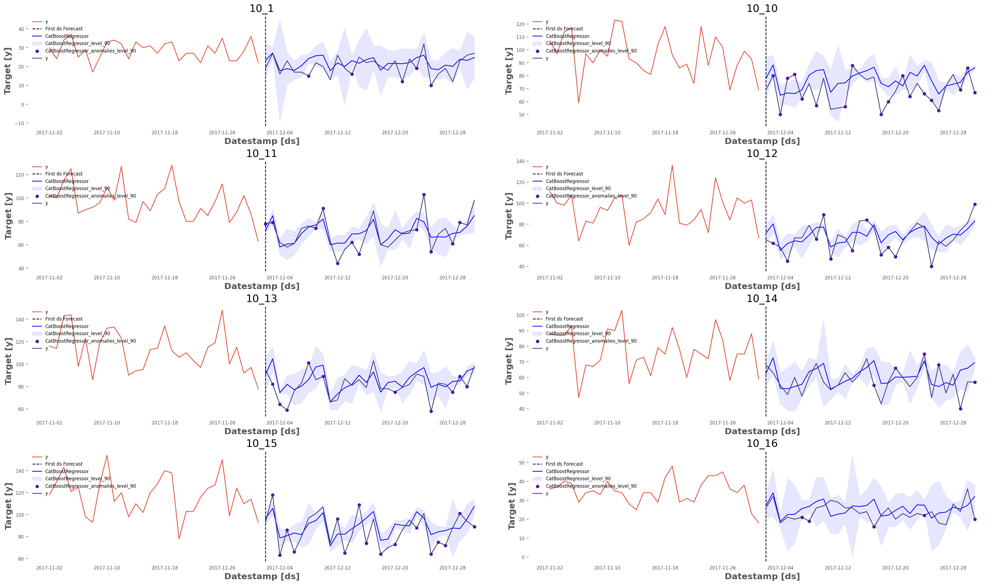

In [79]:
sf.plot(Y_df_train, results_with_intervals,  plot_random=False,
    models=['CatBoostRegressor', 'y'],
    level=[90],
    max_insample_length=30,
    plot_anomalies = True
)

### **XGBoost**

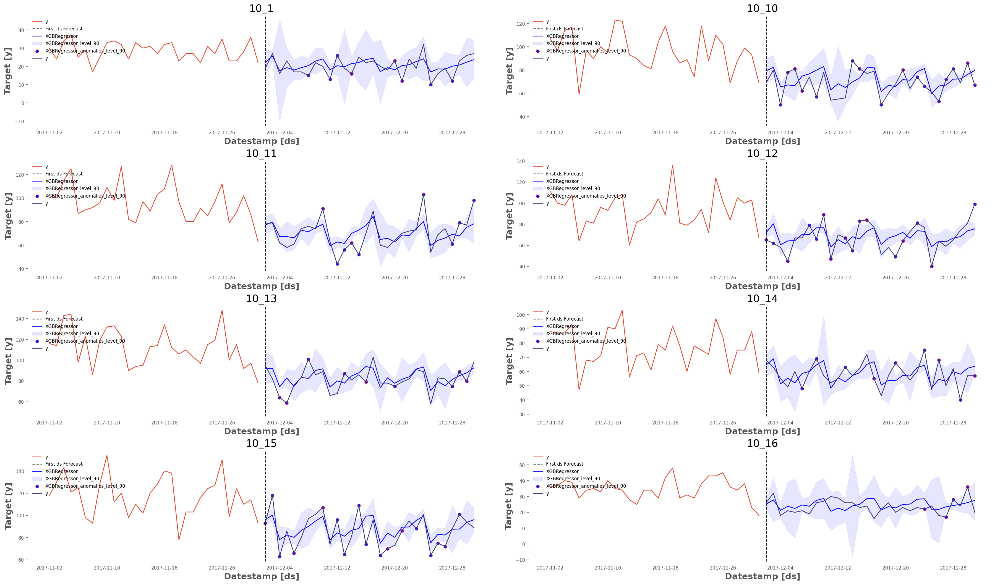

In [80]:
sf.plot(Y_df_train, results_with_intervals,  plot_random=False,
    models=['XGBRegressor', 'y'],
    level=[90],
    max_insample_length=30,
    plot_anomalies = True
)

# **Validating Model’s Performance**

## **Cross Validation in MLForecast**

In [81]:
init = time()
cv_mlf_df = mlf.cross_validation(
    data=Y_df_train,
    window_size=horizon,
    n_windows=3,
    step_size=horizon,
    level=[90],
)
end = time()
print(f'CV Minutes: {(end - init) / 60}')

Default metric period is 5 because MAE is/are not implemented for GPU
Default metric period is 5 because MAE is/are not implemented for GPU
Default metric period is 5 because MAE is/are not implemented for GPU


CV Minutes: 2.3886046846707663


In [82]:
cv_mlf_df.head()

,unique_id,ds,cutoff,y,LGBMRegressor,XGBRegressor,CatBoostRegressor
0,10_1,2017-09-03,2017-09-02,47,31.820760,32.743318,35.269030
1,6_47,2017-09-03,2017-09-02,27,24.264100,22.546929,23.108838
2,6_46,2017-09-03,2017-09-02,65,63.084593,58.567998,61.910342
3,6_45,2017-09-03,2017-09-02,77,88.134379,83.613052,80.634322
4,6_44,2017-09-03,2017-09-02,33,31.236637,30.752677,32.190873


## **Visualizing Cross Validation Splits for a Specific Unique_id**

In [83]:
cutoffs = cv_mlf_df['cutoff'].unique()

for cutoff in cutoffs:
  img = sf.plot(
        Y_df_train,
        cv_mlf_df.query('cutoff == @cutoff').drop(columns=['y', 'cutoff']),
        max_insample_length=30*4,
        unique_ids=['9_1']
        )

## **Aggregate sales forecasts for all items**

In [84]:
agg_cv_mlf_df = cv_mlf_df.loc[:,~cv_mlf_df.columns.str.contains('hi|lo')].groupby(['ds', 'cutoff']).sum(numeric_only=True).reset_index()
agg_cv_mlf_df.insert(0, 'unique_id', 'Total sales (all items)')

agg_mlf_df = fcst_mlf_df.loc[:,~fcst_mlf_df.columns.str.contains('hi|lo')].groupby(['ds']).sum(numeric_only=True).reset_index()
agg_mlf_df.insert(0, 'unique_id', 'Total sales (all items)')

In [85]:
agg_mlf_df.head()

,unique_id,ds,LGBMRegressor,XGBRegressor,CatBoostRegressor
0,Total sales (all items),2017-12-02,25874.487533,24926.022909,24772.342728
1,Total sales (all items),2017-12-03,27203.861836,26178.589564,27816.488295
2,Total sales (all items),2017-12-04,19150.463281,20061.373965,19390.555890
3,Total sales (all items),2017-12-05,21682.547018,21397.089810,20956.470906
4,Total sales (all items),2017-12-06,21532.097310,20959.616991,21146.612057


In [86]:
agg_Y_df = Y_df.groupby(['ds']).sum(numeric_only=True).reset_index()
agg_Y_df.insert(0, 'unique_id', 'Total sales (all items)')

In [87]:
agg_Y_df.head()

,unique_id,ds,y
0,Total sales (all items),2013-01-01,13696
1,Total sales (all items),2013-01-02,13678
2,Total sales (all items),2013-01-03,14488
3,Total sales (all items),2013-01-04,15677
4,Total sales (all items),2013-01-05,16237


In [88]:
for cutoff in cutoffs:
    img = sf.plot(
        agg_Y_df,
        agg_cv_mlf_df.query('cutoff == @cutoff').drop(columns=['y', 'cutoff']),
        max_insample_length=30*4,
    )

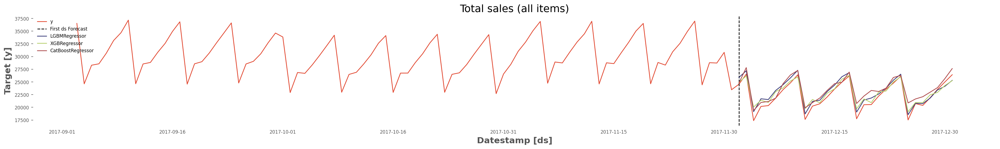

In [89]:
sf.plot(agg_Y_df,
        agg_mlf_df,
        max_insample_length=30*4,
    )

## **Evalute Forecasts per store_item and CV window**

In [90]:
from distributed import Client
from fugue import transform
from fugue_dask import DaskExecutionEngine

In [91]:
def evaluate(df: pd.DataFrame, metrics: List[Callable], is_point = True) -> pd.DataFrame:
    eval_ = {}
    models = df.loc[:, ~df.columns.str.contains('unique_id|y|ds|cutoff|lo|hi')].columns
    for model in models:
        eval_[model] = {}
        for metric in metrics:
            eval_[model][metric.__name__] = metric(df['y'], df[model])
    eval_df = pd.DataFrame(eval_).rename_axis('metric').reset_index()
    if is_point:
      eval_df.insert(0, 'cutoff', df['cutoff'].iloc[0])
    eval_df.insert(0, 'unique_id', df['unique_id'].iloc[0])
    return eval_df

In [92]:
models = cv_mlf_df.loc[:, ~cv_mlf_df.columns.str.contains('unique_id|y|ds|cutoff|lo|hi')].columns
models = ','.join([f"{model}:float" for model in models])
cv_mlf_df['cutoff'] = cv_mlf_df['cutoff'].astype(str)
cv_mlf_df['unique_id'] = cv_mlf_df['unique_id'].astype(str)

Let’s cleate a dask client.

In [93]:
client = Client() # without this, dask is not in distributed mode
# fugue.dask.dataframe.default.partitions determines the default partitions for a new DaskDataFrame
engine = DaskExecutionEngine({"fugue.dask.dataframe.default.partitions": 96})

INFO:distributed.http.proxy:To route to workers diagnostics web server please install jupyter-server-proxy: python -m pip install jupyter-server-proxy
INFO:distributed.scheduler:State start
INFO:distributed.scheduler:  Scheduler at:     tcp://127.0.0.1:33317
INFO:distributed.scheduler:  dashboard at:  http://127.0.0.1:8787/status
INFO:distributed.nanny:        Start Nanny at: 'tcp://127.0.0.1:33101'
INFO:distributed.nanny:        Start Nanny at: 'tcp://127.0.0.1:41067'
INFO:distributed.scheduler:Register worker <WorkerState 'tcp://127.0.0.1:35693', name: 1, status: init, memory: 0, processing: 0>
INFO:distributed.scheduler:Starting worker compute stream, tcp://127.0.0.1:35693
INFO:distributed.core:Starting established connection to tcp://127.0.0.1:59480
INFO:distributed.scheduler:Register worker <WorkerState 'tcp://127.0.0.1:39109', name: 0, status: init, memory: 0, processing: 0>
INFO:distributed.scheduler:Starting worker compute stream, tcp://127.0.0.1:39109
INFO:distributed.core:Sta

The transform function takes the evaluate functions and applies it to each combination of time series (unique_id) and cross validation window (cutoff) using the dask client we created before.


In [94]:
evaluation_point_df = transform(
    cv_mlf_df.loc[:, ~cv_mlf_df.columns.str.contains('lo|hi')],
    evaluate,
    engine="dask",
    params={'metrics': [mse, mae]},
    schema=f"unique_id:str, cutoff:str, metric:str, {models}",
    as_local=True,
    partition={'by': ['unique_id', 'cutoff']}
)

In [95]:
evaluation_point_df.head()

,unique_id,cutoff,metric,LGBMRegressor,XGBRegressor,CatBoostRegressor
0,10_10,2017-11-01,mse,301.507202,130.797577,118.679794
1,10_10,2017-11-01,mae,14.608658,9.759036,9.035148
2,10_11,2017-11-01,mse,405.394043,161.221375,142.913635
3,10_11,2017-11-01,mae,18.076925,10.470477,9.698333
4,10_12,2017-09-02,mse,143.708069,82.369781,84.096931


In [96]:
# Calculate the mean metric for each cross validation window
evaluation_point_df.groupby(['unique_id','cutoff', 'metric']).mean(numeric_only=True)

LGBMRegressor  XGBRegressor  CatBoostRegressor
unique_id cutoff     metric                                                
10_1      2017-09-02 mae          4.375591      4.168086           4.477091
                     mse         28.524738     29.164822          32.079605
          2017-10-02 mae          3.962230      3.280864           3.118062
                     mse         23.691620     18.373991          15.950693
          2017-11-01 mae          4.786700      3.025794           2.872490
...                                    ...           ...                ...
9_9       2017-09-02 mse         51.579758     66.798843          64.238464
          2017-10-02 mae          6.927948      5.506814           5.151281
                     mse         69.361626     45.487617          40.591526
          2017-11-01 mae         10.123530      6.953015           7.426167
                     mse        143.364243     85.395691          84.608376

[3000 rows x 3 columns]

## **Distribution of errors**

In [97]:
import matplotlib.pyplot as plt
import seaborn as sns

In [124]:
evaluation_dist_df = dist_ml_df.reset_index().rename(columns = {'level_0': 'model', 'level_1': 'unique_id'})
evaluation_dist_df_melted = pd.melt(evaluation_dist_df, id_vars=['unique_id', 'model'], var_name='metric', value_name='error')
evaluation_dist_df_melted = evaluation_dist_df_melted[['unique_id', 'metric', 'model', 'error']]

dist_metric_name = list(evaluation_dist_df_melted['metric'].unique())

In [101]:
evaluation_df_melted = pd.melt(evaluation_point_df, id_vars=['unique_id', 'cutoff', 'metric'], var_name='model', value_name='error')
evaluation_df_melted.head()

,unique_id,cutoff,metric,model,error
0,10_10,2017-11-01,mse,LGBMRegressor,301.507202
1,10_10,2017-11-01,mae,LGBMRegressor,14.608658
2,10_11,2017-11-01,mse,LGBMRegressor,405.394043
3,10_11,2017-11-01,mae,LGBMRegressor,18.076925
4,10_12,2017-09-02,mse,LGBMRegressor,143.708069


### **Distribution of MSE Errors per Model, Unique_id and Evaluation Metric**

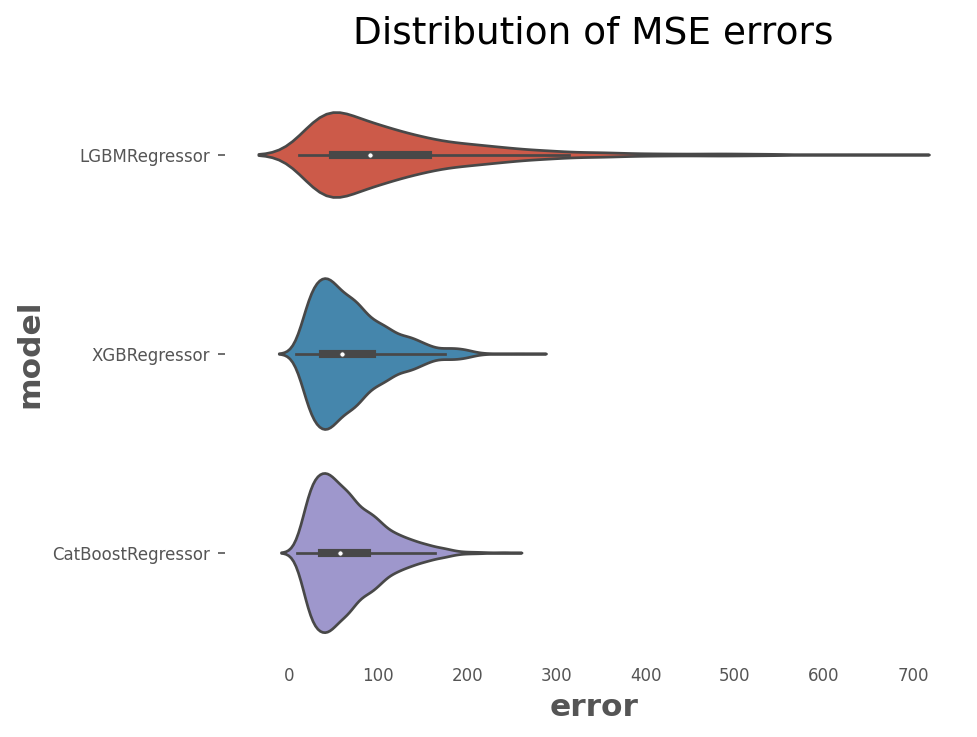

In [102]:
sns.violinplot(evaluation_df_melted.query('metric=="mse"'), x='error', y='model').set_title('Distribution of MSE errors')
plt.tight_layout()
plt.show()

### **Distribution of MAE Errors per Model, Unique_id and Evaluation Metric**

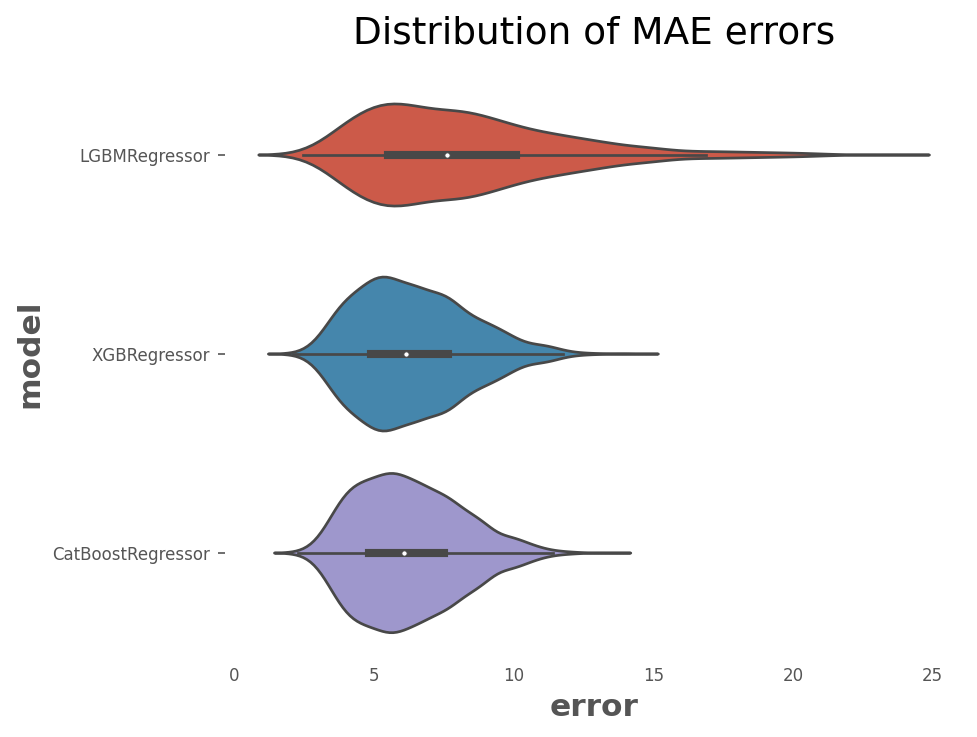

In [103]:
sns.violinplot(evaluation_df_melted.query('metric=="mae"'), x='error', y='model').set_title('Distribution of MAE errors')
plt.tight_layout()
plt.show()

### **Distribution of Scaled CRPS per Model, Unique_id and Evaluation Metric**

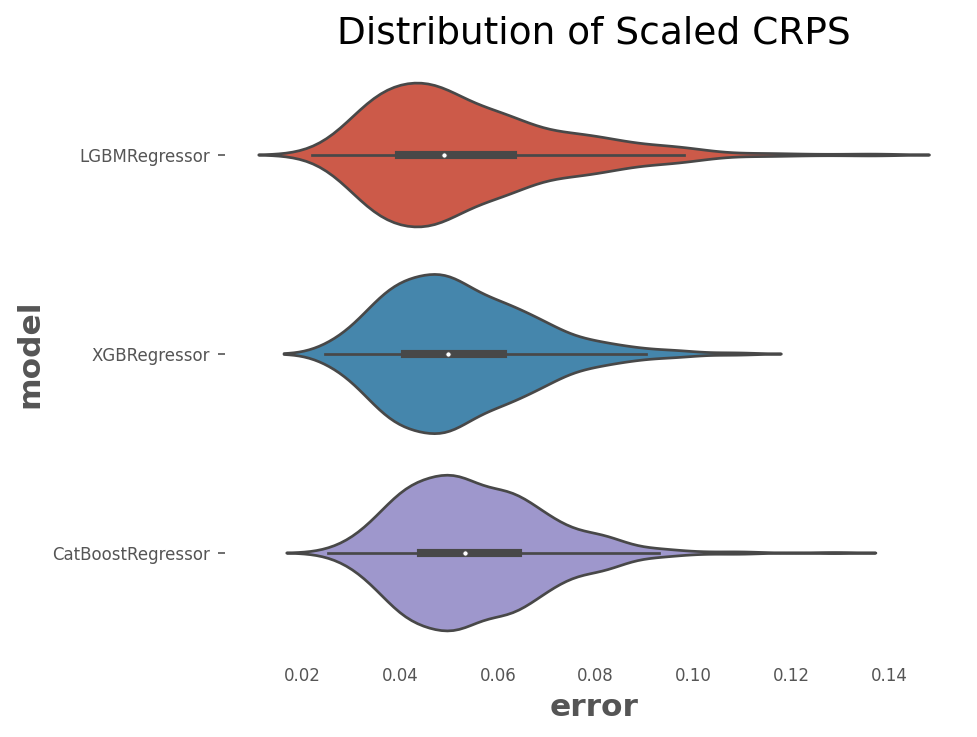

In [104]:
sns.violinplot(evaluation_dist_df_melted.query('metric==@dist_metric_name[6]'), x='error',
               y='model').set_title('Distribution of Scaled CRPS')
plt.tight_layout()
plt.show()

### **Distribution of Coverage per Model, Unique_id and Evaluation Metric**

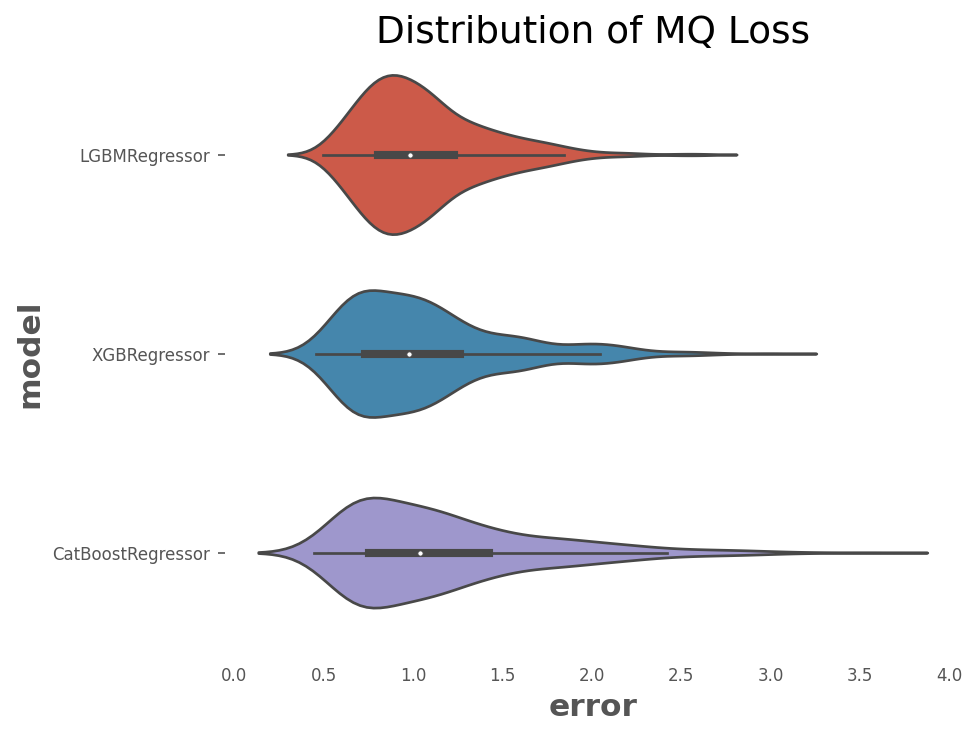

In [105]:
sns.violinplot(evaluation_dist_df_melted.query('metric==@dist_metric_name[2]'), x='error',
               y='model').set_title('Distribution of MQ Loss')
plt.tight_layout()
plt.show()

In [106]:
trained_models = list(evaluation_df_melted.model.unique())

## **Best Performance Model**

In [107]:
evaluation_point_df[trained_models] = evaluation_point_df[trained_models].astype(float)
evaluation_point_df

,unique_id,cutoff,metric,LGBMRegressor,XGBRegressor,CatBoostRegressor
0,10_10,2017-11-01,mse,301.507202,130.797577,118.679794
1,10_10,2017-11-01,mae,14.608658,9.759036,9.035148
2,10_11,2017-11-01,mse,405.394043,161.221375,142.913635
3,10_11,2017-11-01,mae,18.076925,10.470477,9.698333
4,10_12,2017-09-02,mse,143.708069,82.369781,84.096931
...,...,...,...,...,...,...
2995,9_7,2017-11-01,mae,11.237848,7.486921,7.786553
2996,9_8,2017-09-02,mse,146.149170,89.599976,85.465080
2997,9_8,2017-09-02,mae,9.995820,7.159827,7.418986
2998,9_8,2017-10-02,mse,121.245499,83.223129,85.494865


**How to choose the most well-performed models ?**

We can find the best performing model per store_item and evaluation metric by counting how many cross validation fold & metric each model overperforms the rest.

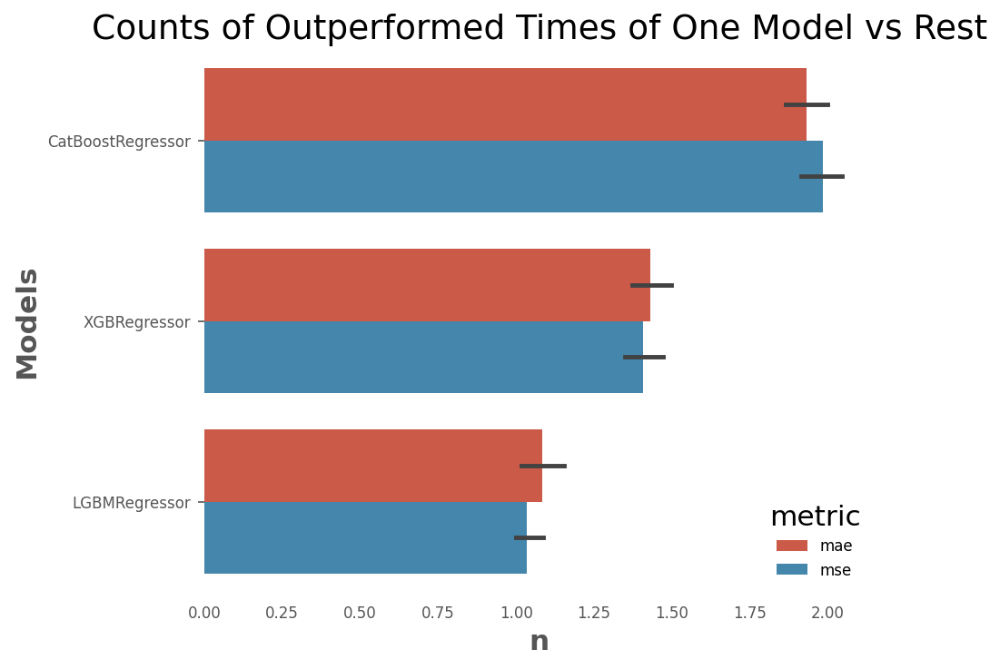

In [ ]:
# Choose the best model for each time series, metric, and cross validation window
evaluation_point_df['best_model'] = evaluation_point_df.idxmin(axis=1, numeric_only=True)
# count how many times a model wins per metric and cross validation window
count_best_model = evaluation_point_df.groupby(['unique_id', 'metric', 'best_model']).size().rename('n').to_frame().reset_index()
# plot results

sns.barplot(count_best_model, x='n', y='best_model', hue='metric')
plt.ylabel("Models")
plt.title("Counts of Outperformed Times of One Model vs Rest")
plt.tight_layout()
plt.show()

Although `CatBoost` is the best performing model for all point forecast evaluation metrics, this does not mean that CatBoost is the best performing model for each individual "store_item"

In [ ]:
count_best_model

,unique_id,metric,best_model,n
0,10_1,mae,CatBoostRegressor,2
1,10_1,mae,XGBRegressor,1
2,10_1,mse,CatBoostRegressor,2
3,10_1,mse,LGBMRegressor,1
4,10_10,mae,CatBoostRegressor,1
...,...,...,...,...
1781,9_8,mse,XGBRegressor,1
1782,9_9,mae,CatBoostRegressor,2
1783,9_9,mae,XGBRegressor,1
1784,9_9,mse,CatBoostRegressor,2


Regarding the probabilistic forecast, the best model that capture the uncertainty more neatly is `LGBM` regressor. Ranking in the second place is `Catboost` and `XGBoost` anticipatedly performs worse than its two successors, which is in the same agreement with many literatures.

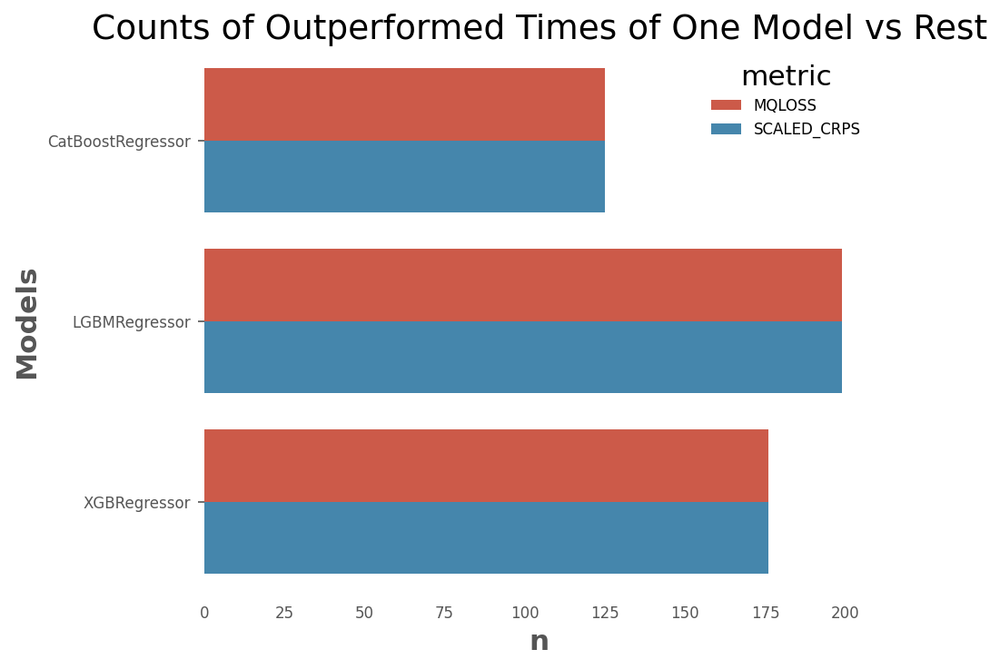

In [239]:
evaluation_dist_df_compare = evaluation_dist_df_melted.loc[evaluation_dist_df_melted['metric'].isin(['MQLOSS', 'SCALED_CRPS'])].reset_index(drop = True)
min_ids = evaluation_dist_df_compare.groupby(['unique_id', 'metric'], sort = False).error.idxmin().values
best_dist_model = evaluation_dist_df_compare.loc[min_ids].reset_index(drop = True)
best_dist_model[(best_dist_model['model'] == 'CatBoostRegressor') & (best_dist_model['metric'] == 'MQLOSS')]
count_best_dist_model = best_dist_model.groupby(['metric', 'model']).size().rename('n').to_frame().reset_index()

sns.barplot(count_best_dist_model, x='n', y='model', hue='metric')
plt.ylabel("Models")
plt.title("Counts of Outperformed Times of One Model vs Rest")
plt.tight_layout()
plt.show()

## **Check Most Suitable Model for Specific Sales Series**

We can examine the best model for store_item="1_1" sales forecasting to know the most appropriate forecasting models for each sales series

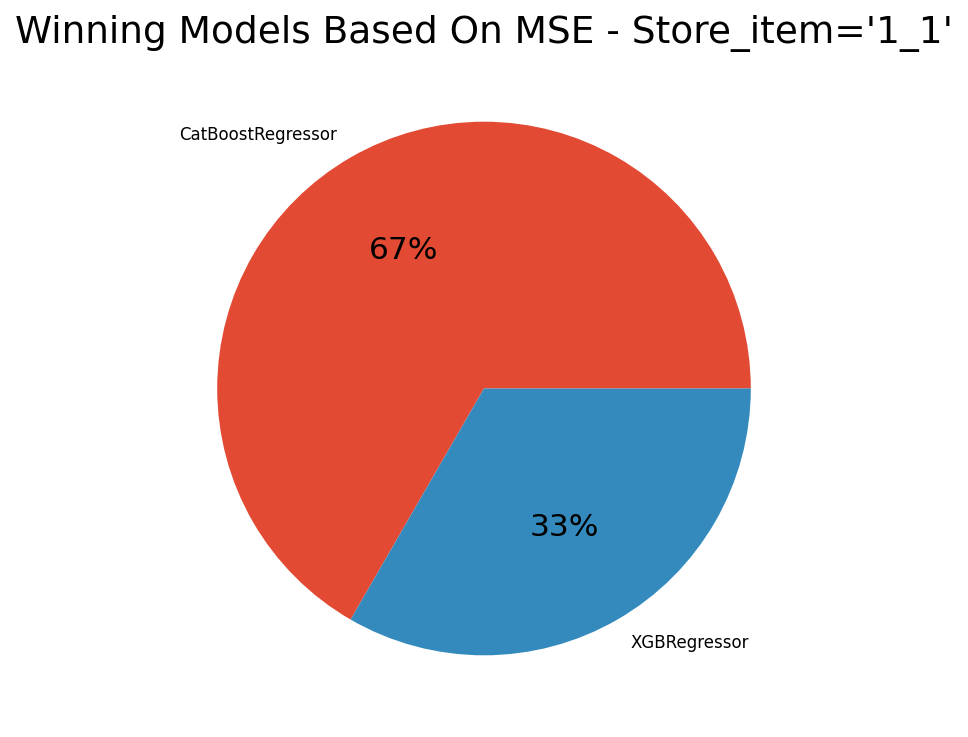

In [ ]:
# For the mse, calculate how many times a model wins
# add colors
# colors = ['#ff9999','#66b3ff','#99ff99','#ffcc99']
count_best_model_mse = count_best_model.query('metric == "mse" & unique_id == "1_1"')
counts_series_mse = count_best_model_mse["n"]
plt.pie(counts_series_mse, labels=count_best_model_mse["best_model"], autopct='%.0f%%', colors=COLORS[0:2])
plt.title("Winning Models Based On MSE - Store_item='1_1'")
plt.tight_layout()
plt.show()

CatBoostRegressor was the best performing model based on MSE for 2 out of the 3 validation folds of store_item 1_1.

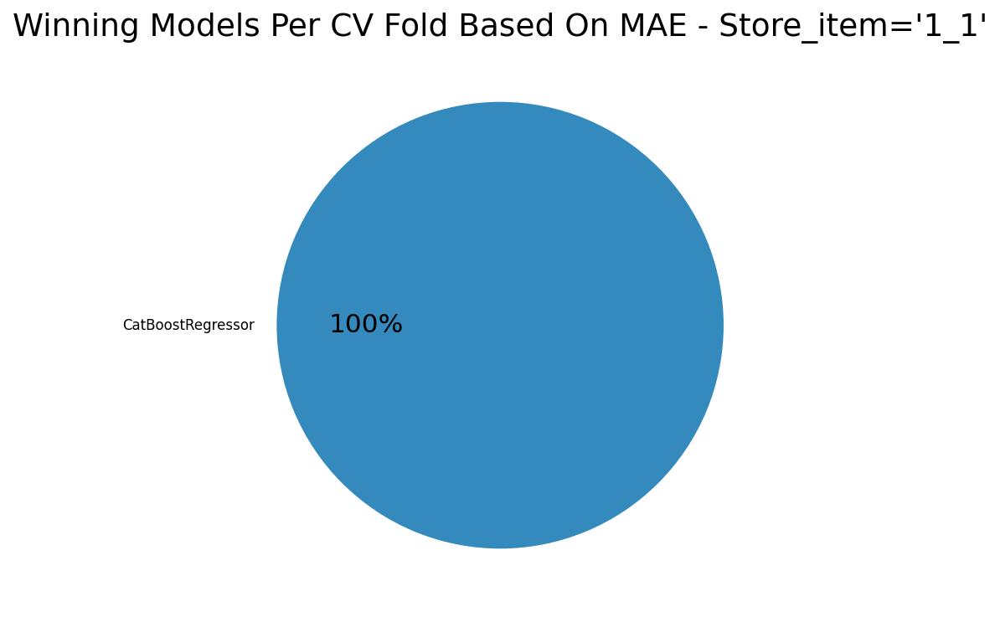

In [ ]:
# For the mae, calculate how many times a model wins
count_best_model_mae = count_best_model.query('metric == "mae" & unique_id == "1_1"')
counts_series_smape = count_best_model_mae["n"]
plt.pie(counts_series_smape, labels=count_best_model_mae["best_model"], autopct='%.0f%%', colors=COLORS[1:3])
plt.title("Winning Models Per CV Fold Based On MAE - Store_item='1_1'")
plt.tight_layout()
plt.show()

CatBoostRegressor was again the best performing model based on MAE for 2 out of the 3 validation folds of store_item 1_1.

## **Visualize the forecasts of the best model for unique_id == "1_1"**

* The best model based on both MSE and MAE is CatBoostRegressor

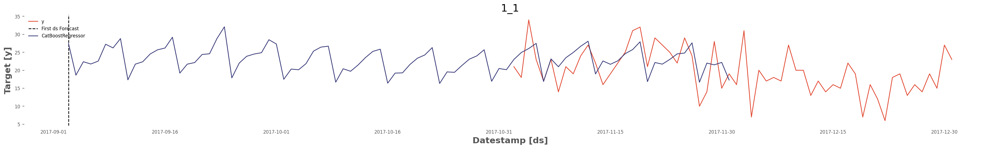

In [ ]:
eval_series_df = evaluation_point_df.query('metric == "mse" & unique_id == "1_1"').groupby(['unique_id']).mean(numeric_only=True)
eval_series_df['best_model'] = eval_series_df.idxmin(axis=1)

sf.plot(Y_df, cv_mlf_df.drop(columns=['cutoff', 'y']),
        max_insample_length=30 * 2,
        models=['CatBoostRegressor'],
        unique_ids=eval_series_df.query('best_model == "CatBoostRegressor"').index[:8])

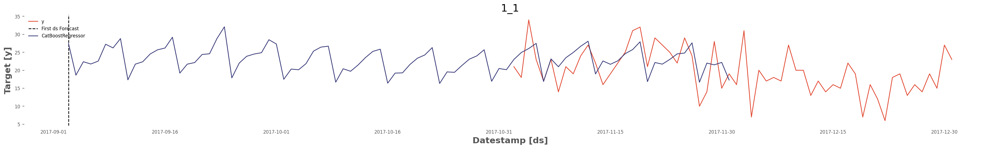

In [ ]:
eval_series_df = evaluation_point_df.query('metric == "mae" & unique_id == "1_1"').groupby(['unique_id']).mean(numeric_only=True)
eval_series_df['best_model'] = eval_series_df.idxmin(axis=1)

sf.plot(Y_df, cv_mlf_df.drop(columns=['cutoff', 'y']),
        max_insample_length=30 * 2,
        models=['CatBoostRegressor'],
        unique_ids=eval_series_df.query('best_model == "CatBoostRegressor"').index[:8])

We will use the best forecasting model to create a simulation model that will enhance our demand planning for store restocking. This will allow us to develop replenishment strategies that optimize inventory levels and reduce the number of warehouse deliveries.

# **Experiment**

In [ ]:
# from statsmodels.tsa.statespace.sarimax import SARIMAX

# p = d = q = range(0, 2)
# pdq = list(itertools.product(p, d, q))
# seasonal_pdq = [(x[0], x[1], x[2], 12) for x in list(itertools.product(p, d, q))]

# def sarima_optimizer_mae(train, test, pdq, seasonal_pdq):
#     best_mae, best_order, best_seasonal_order = float("inf"), None, None
#     for param in pdq:
#         for param_seasonal in seasonal_pdq:
#             try:
#                 model = SARIMAX(train, order=param, seasonal_order=param_seasonal)
#                 sarima_model = model.fit(disp=0)
#                 y_pred_test = sarima_model.get_forecast(steps=12)
#                 y_pred = y_pred_test.predicted_mean
#                 mae = mean_absolute_error(test, y_pred)
#                 if mae < best_mae:
#                     best_mae, best_order, best_seasonal_order = mae, param, param_seasonal
#             except:
#                 continue
#     return best_order, best_seasonal_order, best_mae

# References

This notebook is based on the following publicly available resources
* [Nixtla Statistical, Machine Learning and Neural Forecasting methods](https://nixtla.github.io/statsforecast/docs/tutorials/statisticalneuralmethods.html)
* [Store Item Demand Forecasting Challenge dataset from Kaggle](https://www.kaggle.com/competitions/demand-forecasting-kernels-only/data?select=train.csv)